# Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the Jupyter Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to **File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this Jupyter notebook.



---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Write your Algorithm
* [Step 6](#step6): Test Your Algorithm

---
<a id='step0'></a>
## Step 0: Import Datasets

Make sure that you've downloaded the required human and dog datasets:
* Download the [dog dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip).  Unzip the folder and place it in this project's home directory, at the location `/dog_images`. 

* Download the [human dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip).  Unzip the folder and place it in the home directory, at location `/lfw`.  

*Note: If you are using a Windows machine, you are encouraged to use [7zip](http://www.7-zip.org/) to extract the folder.*

In the code cell below, we save the file paths for both the human (LFW) dataset and dog dataset in the numpy arrays `human_files` and `dog_files`.

In [1]:
import matplotlib.pyplot as plt                        
%matplotlib inline 

import numpy as np
from glob import glob
import os
import time
from tqdm import tqdm
#from time import time
import copy
import cv2                

# load filenames for human and dog images
# human_files = np.array(glob("/data/lfw/*/*"))
# dog_files = np.array(glob("/data/dog_images/*/*/*"))

# have copied the images to my local workspace to allow for removing corrupted images, 
# so set up directory variables to allow for loading from either original or workspace
orig_dir = "/data/"
work_dir = "/home/workspace/data/"
project_dir = "/home/workspace/dog_project/"

human_files = np.array(glob(orig_dir + 'lfw/*/*'))
dog_files   = np.array(glob(orig_dir + 'dog_images/*/*/*'))

# print number of images in each dataset
print('There are %d total human images.' % len(human_files))
print('There are %d total dog images.' % len(dog_files))

There are 13233 total human images.
There are 8351 total dog images.


In [2]:
# global variables used throughout...
model_name = ""
use_weights = False

In [3]:
import torch
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [4]:
# see https://github.com/pytorch/pytorch/issues/7068
import random
SEED = 0
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
torch.backends.cudnn.deterministic=True

In [5]:
def get_learning_rate(optimizer):
    lr=[]
    for param_group in optimizer.param_groups:
       lr +=[ param_group['lr'] ]
    return lr

In [6]:
def unfreeze(model):
    for name, child in model.named_children():
        for param in child.parameters():
            param.requires_grad = True
        unfreeze(child)

In [7]:
def freeze(model):
    for name, child in model.named_children():
        for param in child.parameters():
            param.requires_grad = False
        freeze(child)

In [8]:
def compare_dicts(dict_1, dict_2):
    dicts_differ = 0
    for key_item_1, key_item_2 in zip(dict_1.items(), dict_2.items()):
        if torch.equal(key_item_1[1], key_item_2[1]):
            pass
        else:
            dicts_differ += 1
            if (key_item_1[0] == key_item_2[0]):
                print('Mismtach found at', key_item_1[0])
            else:
                raise Exception
                
    if dicts_differ == 0:
        print('State_Dicts match')

<a id='reloadModel'></a>

In [9]:
def reloadModel(model, optimizer, state_dicts_name='model_d_502.pth', 
                learning_rate=1e-05, isV1=False, resetarray=True):
    
    global train_losses, valid_losses, val_acc_history, lr_hist
    global best_acc, best_acc_epoch, best_val_epoch, epoch_loss_min

    state_dicts = torch.load(state_dicts_name, map_location=lambda storage, loc: storage)   

    model_statedict = state_dicts['model_statedict']
    optimizer_statedict = state_dicts['optimizer_statedict']
        
    if isV1:
        model_dict = model.state_dict()
        # 1. filter out unnecessary keys
        pretrained_dict = {k: v for k, v in model_statedict.items() if k in model_dict}
        # 2. overwrite entries in the existing state dict
        model_dict.update(pretrained_dict) 
        # 3. load the new state dict
        model.load_state_dict(pretrained_dict)
    else:    
        model.load_state_dict(model_statedict)
        
    parameters = filter(lambda p: p.requires_grad, model.parameters())
    optimizer  = torch.optim.Adam(parameters, lr=learning_rate)
    
    optimizer.load_state_dict(optimizer_statedict)    

    best_acc_epoch = state_dicts['best_acc_epoch']
    best_val_epoch = state_dicts['best_val_epoch']
    
    if resetarray:
        train_losses = state_dicts['train_losses'][:best_acc_epoch]
        valid_losses = state_dicts['valid_losses'][:best_acc_epoch]
        val_acc_history = state_dicts['val_acc_history'][:best_acc_epoch]
        #train_acc_history = state_dicts['train_acc_history'][:best_acc_epoch]
        
        best_acc = val_acc_history[-1]
        epoch_loss_min = valid_losses[-1]
    else:
        train_losses = state_dicts['train_losses']
        valid_losses = state_dicts['valid_losses']
        val_acc_history = state_dicts['val_acc_history']
        #train_acc_history = state_dicts['train_acc_history']
        
        best_acc = val_acc_history[best_acc_epoch]
        epoch_loss_min = valid_losses[best_val_epoch]

## Preparation for predictions: Utility functions

The following image-handling utility code is adapted from open source code found on the internet or in Udacity provided notebooks... 

In [10]:
def imshow(image, ax=None, title=None, color="black", filename=None, normalize=True):
    """Imshow for Tensor."""
    
    global img_means, img_std
    
    if img_means is not None:
        imgmeans = img_means
    else: 
        imgmeans = [0.485, 0.456, 0.406]

    if img_std is not None:
        imgstd = img_std
    else: 
        imgstd = [0.229, 0.224, 0.225]
        
    if isinstance(image, torch.Tensor): 
        image = image.cpu()
        image = copy.deepcopy(image.numpy())
        
    if ax is None:
        fig, ax = plt.subplots()
    
    # PyTorch tensors assume the color channel is the first dimension
    # but matplotlib assumes is the third dimension
    if isinstance(image, np.ndarray):     
        image = image.transpose((1, 2, 0))
    else:
        image = image.numpy.transpose((1, 2, 0))
    
    
    if normalize:
        # Undo preprocessing
        mean = np.array(imgmeans)
        std = np.array(imgstd)
        image = std * image + mean
        # Image needs to be clipped between 0 and 1 or it looks like noise when displayed
        image = np.clip(image, 0, 1)

    if title is not None:
        ax.set_title(title, color=color)
    if filename is not None: 
        ax.set_xlabel(filename)
        
    ax.imshow(image)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='both', length=0)
    ax.set_xticklabels('')
    ax.set_yticklabels('')
    
    return ax

In [11]:
def img_resize(img, sz):
    ''' Resize image to passed size based on the shorter of the image sides, using image aspect ratio
    '''
    w, h = img.size
    aspect_ratio = w / h if h < w else h / w
    width  = int(sz) if w < h else int(round(sz * aspect_ratio, 0))
    height = int(sz) if w > h else int(round(sz * aspect_ratio, 0))

    return img.resize((width, height))

def img_crop(img, sz):
    ''' Return a cropped square region from the centre of an image
    '''
    w, h = img.size
    x = (w - sz) / 2
    y = (h - sz) / 2
    x1 = x + sz
    y1 = y + sz

    return img.crop((x, y, x1, y1))

def img_process(img_path, img_sz=224, max_sz=None):
    ''' 
    Scale, crop and normalize an image, returning it as a numpy array
    '''
    global img_means, img_std
    
    if img_means is not None:
        imgmeans = img_means
    else: 
        imgmeans = [0.485, 0.456, 0.406]

    if img_std is not None:
        imgstd = img_std
    else: 
        imgstd = [0.229, 0.224, 0.225]
        
    if max_sz is None:
        max_sz = img_sz + (img_sz // 7)
        
    # Open the image
    from PIL import Image
    img = Image.open(img_path)
    
    # Resize image so shortest side is 256 pixels (for 224 image, 341 is standard for 229)
    img = img_resize(img, max_sz)
    
    # Crop image
    img = img_crop(img, img_sz)

    # Normalize
    img = np.array(img) / 255
    
    mean = np.array(imgmeans) # provided mean or ImageNet mean
    std = np.array(imgstd)    # provided std or ImageNet std
    
    img = (img - mean) / std
    
    # Pytorch requires color channels in the first dimension (opposite of PIL)
    img = img.transpose((2, 0, 1))
    
    return img

**Have downloaded a [dictionary](https://gist.githubusercontent.com/yrevar/942d3a0ac09ec9e5eb3a/raw/238f720ff059c1f82f368259d1ca4ffa5dd8f9f5/imagenet1000_clsidx_to_labels.txt) of the entire ImageNet library into the workspace so we can match names to the class values...**

In [12]:
os.path.isfile(project_dir + "imagenet1000_clsidx_to_labels.txt")

True

In [13]:
ImageNetDict = eval(open("imagenet1000_clsidx_to_labels.txt").read())

**Set image mean and std to values (see calculations later in notebook) if ImageNet defaults are not wanted...**

In [14]:
# Allows for specific calculation of image means and standard deviation, 
# defaults are the imagenet values...
img_means = None
img_std = None

In [15]:
img_means = [0.4868, 0.4666, 0.3972]
img_std = [0.2605, 0.2551, 0.2609]

To allow for long-running processes (i.e. network training) import [workspace_utils](https://github.com/udacity/workspaces-student-support/tree/master/jupyter). Using magic command %load to import into next cell.

In [16]:
# %load workspace_utils.py
import signal
 
from contextlib import contextmanager
 
import requests
 
 
DELAY = INTERVAL = 4 * 60  # interval time in seconds
MIN_DELAY = MIN_INTERVAL = 2 * 60
KEEPALIVE_URL = "https://nebula.udacity.com/api/v1/remote/keep-alive"
TOKEN_URL = "http://metadata.google.internal/computeMetadata/v1/instance/attributes/keep_alive_token"
TOKEN_HEADERS = {"Metadata-Flavor":"Google"}
 
 
def _request_handler(headers):
    def _handler(signum, frame):
        requests.request("POST", KEEPALIVE_URL, headers=headers)
    return _handler
 
 
@contextmanager
def active_session(delay=DELAY, interval=INTERVAL):
    """
    Example:
 
    from workspace_utils import active_session
 
    with active_session():
        # do long-running work here
    """
    token = requests.request("GET", TOKEN_URL, headers=TOKEN_HEADERS).text
    headers = {'Authorization': "STAR " + token}
    delay = max(delay, MIN_DELAY)
    interval = max(interval, MIN_INTERVAL)
    original_handler = signal.getsignal(signal.SIGALRM)
    try:
        signal.signal(signal.SIGALRM, _request_handler(headers))
        signal.setitimer(signal.ITIMER_REAL, delay, interval)
        yield
    finally:
        signal.signal(signal.SIGALRM, original_handler)
        signal.setitimer(signal.ITIMER_REAL, 0)
 
 
def keep_awake(iterable, delay=DELAY, interval=INTERVAL):
    """
    Example:
 
    from workspace_utils import keep_awake
 
    for i in keep_awake(range(5)):
        # do iteration with lots of work here
    """
    with active_session(delay, interval): yield from iterable


<a id='step1'></a>
## Step 1: Detect Humans

In this section, we use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  

OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.  In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

In [17]:
import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline                               

Number of faces detected: 1


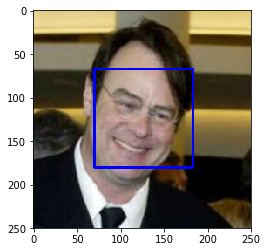

In [18]:
# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[0])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [19]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 
(You can print out your results and/or write your percentages in this cell)

In [20]:
from tqdm import tqdm

human_files_short = human_files[:100]
dog_files_short = dog_files[:100]

#-#-# Do NOT modify the code above this line. #-#-#

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.
def countFaces(faceList):
    return [face_detector(img) for img in faceList]

human_faces = countFaces(human_files_short)
dog_faces = countFaces(dog_files_short)

print("{}% of human faces detected".format(sum(human_faces)))
print("{}% of dogs detected as having human faces!".format(sum(dog_faces)))

98% of human faces detected
17% of dogs detected as having human faces!
CPU times: user 1min 30s, sys: 708 ms, total: 1min 30s
Wall time: 1min 31s


**In the first 1,000 images from each set, 98% of the human faces were detected, conversely 17% of dogs were detected as having human faces**

In [21]:
bad_human_faces = [a for a, b in zip(human_files_short, human_faces) if b == False]
bad_dog_faces = [a for a, b in zip(dog_files_short, dog_faces) if b == True]

In [22]:
len(bad_human_faces), len(bad_dog_faces)

(2, 17)

In [23]:
for ii in range(len(bad_human_faces)):
    print(bad_human_faces[ii])  

/data/lfw/Julianne_Moore/Julianne_Moore_0002.jpg
/data/lfw/Clive_Lloyd/Clive_Lloyd_0001.jpg


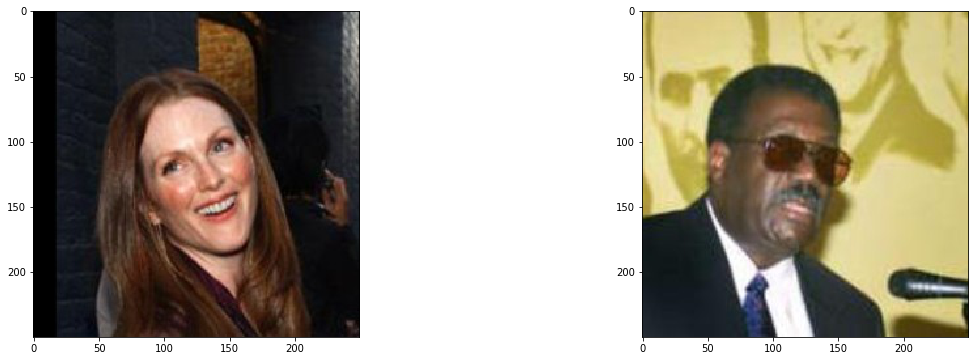

In [24]:
_, axes = plt.subplots(figsize=(20,6), ncols=2)

for ii in range(2):
    ax = axes[ii]
    img = cv2.imread(bad_human_faces[ii])
    cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(cv_rgb)

In [25]:
for ii in range(len(bad_dog_faces)):
    print(bad_dog_faces[ii]) 

/data/dog_images/train/103.Mastiff/Mastiff_06844.jpg
/data/dog_images/train/103.Mastiff/Mastiff_06841.jpg
/data/dog_images/train/103.Mastiff/Mastiff_06860.jpg
/data/dog_images/train/103.Mastiff/Mastiff_06834.jpg
/data/dog_images/train/103.Mastiff/Mastiff_06829.jpg
/data/dog_images/train/103.Mastiff/Mastiff_06856.jpg
/data/dog_images/train/103.Mastiff/Mastiff_06872.jpg
/data/dog_images/train/059.Doberman_pinscher/Doberman_pinscher_04181.jpg
/data/dog_images/train/059.Doberman_pinscher/Doberman_pinscher_04209.jpg
/data/dog_images/train/059.Doberman_pinscher/Doberman_pinscher_04207.jpg
/data/dog_images/train/059.Doberman_pinscher/Doberman_pinscher_04180.jpg
/data/dog_images/train/059.Doberman_pinscher/Doberman_pinscher_04186.jpg
/data/dog_images/train/059.Doberman_pinscher/Doberman_pinscher_04191.jpg
/data/dog_images/train/059.Doberman_pinscher/Doberman_pinscher_04189.jpg
/data/dog_images/train/059.Doberman_pinscher/Doberman_pinscher_04214.jpg
/data/dog_images/train/059.Doberman_pinscher/

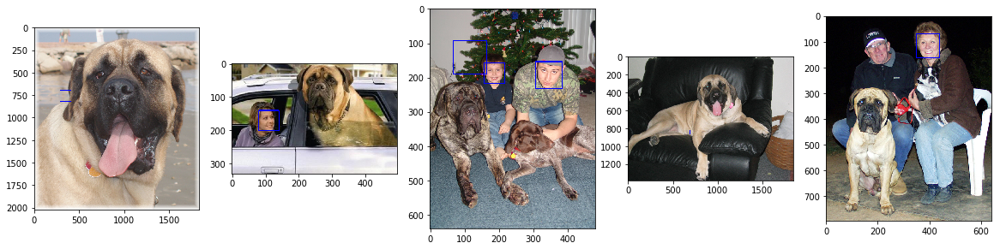

In [26]:
_, axes = plt.subplots(figsize=(20,6), ncols=5)

for ii in range(5):
    ax = axes[ii]
    img = cv2.imread(bad_dog_faces[ii])
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    for (x,y,w,h) in faces:
        cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)    
    ax.imshow(cv_rgb)

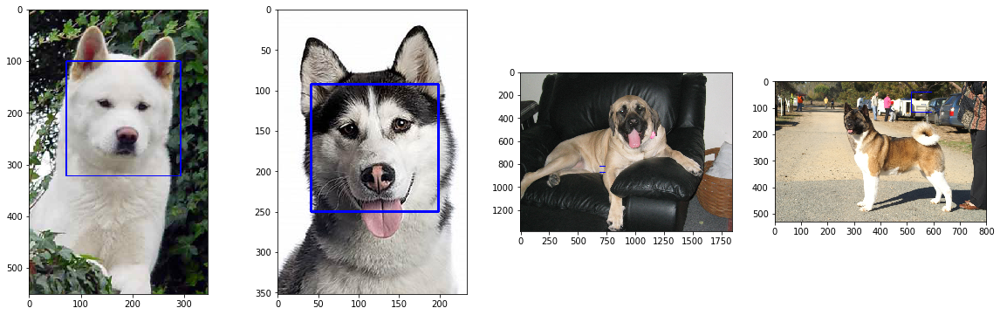

In [27]:
testdogs = [orig_dir + 'dog_images/test/004.Akita/Akita_00258.jpg', 
            orig_dir + 'dog_images/test/005.Alaskan_malamute/Alaskan_malamute_00330.jpg', 
            orig_dir + 'dog_images/train/103.Mastiff/Mastiff_06834.jpg', 
            orig_dir + 'dog_images/test/004.Akita/Akita_00282.jpg']
_, axes = plt.subplots(figsize=(20,6), ncols=4)
for ii in range(4):
    ax = axes[ii]
    img = cv2.imread(testdogs[ii])
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    for (x,y,w,h) in faces:
        cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)    
    ax.imshow(cv_rgb)

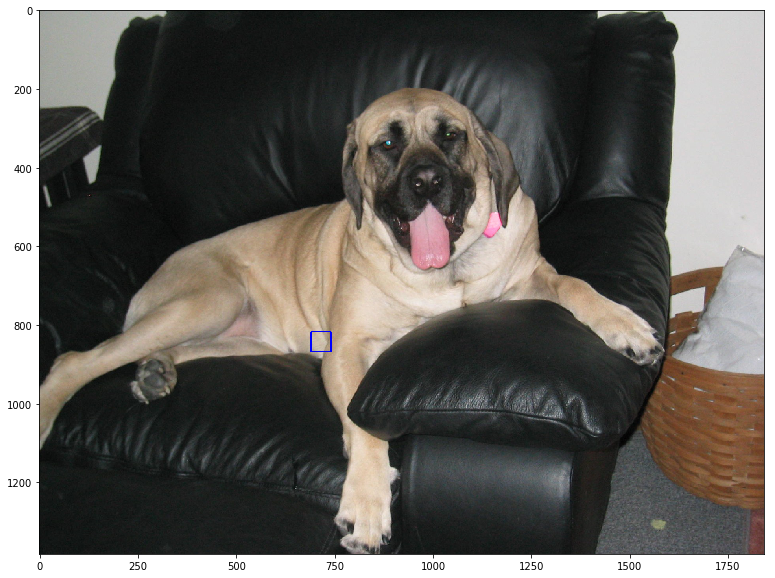

In [28]:
figsize = (20, 10)

fig = plt.figure(figsize=figsize)
    
img = cv2.imread(testdogs[2])
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray)
for (x,y,w,h) in faces:
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(cv_rgb)

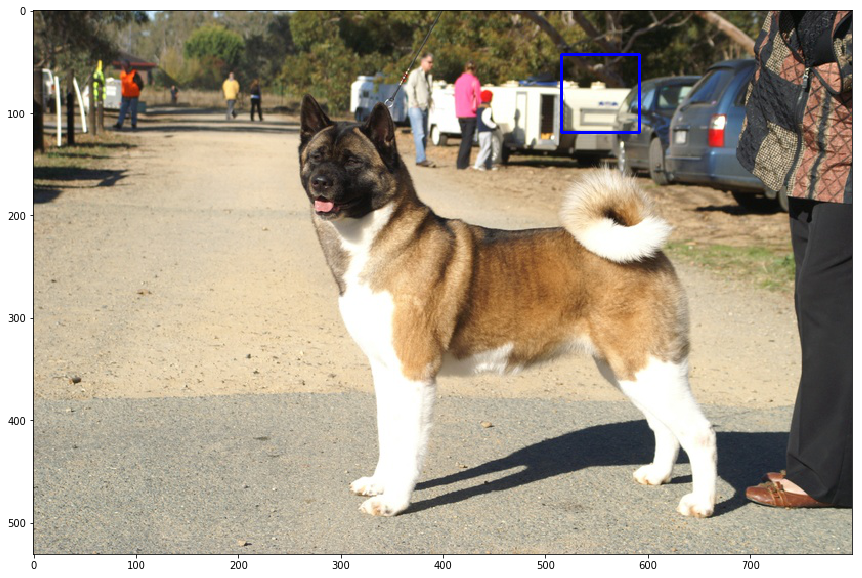

In [29]:
figsize = (20, 10)

fig = plt.figure(figsize=figsize)
    
img = cv2.imread(testdogs[3])
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray)
for (x,y,w,h) in faces:
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(cv_rgb)

Examination of a few images shows the failure of human face detection may be due to poor resolution or focus, contrast and color in the human photos, or if the photo is a profile or otherwise obscured. There may be genuine human faces contained in some of the dog photos, or dogs facing front-on to the camera with clearly discernable features can be interpreted as having a human face. Additionally, geometric shapes that includes something like two eyes and a mouth can be interpreted as a face, and even worse - there can be no understandable reason for face detection!

---

We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [30]:
### (Optional) 
### TODO: Test performance of anotherface detection algorithm.
### Feel free to use as many code cells as needed.

## Further explore the data

In [31]:
data_dir  = orig_dir + 'dog_images/'
train_dir = data_dir + 'train/'
valid_dir = data_dir + 'valid/'
test_dir  = data_dir + 'test/'

In [32]:
from pathlib import Path
import os

def folders_in_path(path):
    if not Path.is_dir(path):
        raise ValueError("argument is not a directory")
    yield from filter(Path.is_dir, path.iterdir())

def folders_in_depth(path, depth):
    if 0 > depth:
        raise ValueError("depth smaller 0")
    if 0 == depth:
        yield from folders_in_path(path)
    else:
        for folder in folders_in_path(path):
            yield from folders_in_depth(folder, depth-1)

def files_in_path(path):
    if not Path.is_dir(path):
        raise ValueError("argument is not a directory")
    yield from filter(Path.is_file, path.iterdir())

In [33]:
def files_per_folder(dir_path, dir_desc):
    files_per_folder = []
    for folder in folders_in_depth(Path.cwd()/dir_path,0):
        files = list(files_in_path(folder))
        foldername = os.path.basename(os.path.normpath(folder))
        files_per_folder.append((foldername, len(files)))

    print(dir_desc)
    print("-" * 48)
    for image in files_per_folder:
        img_name = image[0]+' '*50
        img_name = img_name[:45]
        img_count = image[1]
        print('{} {}'.format(img_name, img_count))

In [34]:
files_per_folder(train_dir, "Training data files per class:")

Training data files per class:
------------------------------------------------
103.Mastiff                                   58
059.Doberman_pinscher                         47
055.Curly-coated_retriever                    50
031.Borzoi                                    56
024.Bichon_frise                              62
049.Chinese_crested                           50
067.Finnish_spitz                             34
130.Welsh_springer_spaniel                    44
019.Bedlington_terrier                        48
115.Papillon                                  63
126.Saint_bernard                             30
013.Australian_terrier                        46
116.Parson_russell_terrier                    30
107.Norfolk_terrier                           46
133.Yorkshire_terrier                         30
032.Boston_terrier                            65
108.Norwegian_buhund                          26
028.Bluetick_coonhound                        35
066.Field_spaniel                     

In [35]:
files_per_folder(valid_dir, "Validation data files per class:")

Validation data files per class:
------------------------------------------------
103.Mastiff                                   7
059.Doberman_pinscher                         6
055.Curly-coated_retriever                    6
031.Borzoi                                    7
024.Bichon_frise                              7
049.Chinese_crested                           7
067.Finnish_spitz                             4
130.Welsh_springer_spaniel                    6
019.Bedlington_terrier                        6
115.Papillon                                  8
126.Saint_bernard                             4
013.Australian_terrier                        6
116.Parson_russell_terrier                    4
107.Norfolk_terrier                           6
133.Yorkshire_terrier                         4
032.Boston_terrier                            8
108.Norwegian_buhund                          4
028.Bluetick_coonhound                        5
066.Field_spaniel                             4
129.Ti

In [36]:
files_per_folder(test_dir, "Testing data files per class:")

Testing data files per class:
------------------------------------------------
103.Mastiff                                   7
059.Doberman_pinscher                         6
055.Curly-coated_retriever                    7
031.Borzoi                                    7
024.Bichon_frise                              8
049.Chinese_crested                           6
067.Finnish_spitz                             4
130.Welsh_springer_spaniel                    5
019.Bedlington_terrier                        6
115.Papillon                                  8
126.Saint_bernard                             3
013.Australian_terrier                        6
116.Parson_russell_terrier                    4
107.Norfolk_terrier                           6
133.Yorkshire_terrier                         4
032.Boston_terrier                            8
108.Norwegian_buhund                          3
028.Bluetick_coonhound                        4
066.Field_spaniel                             4
129.Tibet

In [37]:
files_per_folder(orig_dir + "lfw/", "Human image counts:")

Human image counts:
------------------------------------------------
Dan_Ackroyd                                   1
Alex_Corretja                                 1
Daniele_Bergamin                              1
Donald_Carty                                  1
Barry_Switzer                                 1
Jeong_Se-hyun                                 9
Ellen_Engleman                                2
Peter_Lundgren                                1
Stephen_Thompson                              1
Hernan_Crespo                                 1
Marquier_Montano_Contreras                    1
Adriana_Lima                                  1
Penny_Dupuie                                  1
Jimmy_Kimmel                                  2
Michael_Clarke_Duncan                         1
Jane_Clayson                                  1
Paul_Celluci                                  1
Jorge_Valdano                                 2
Rodolfo_Abalos                                1
Paul_Reiser        

---  
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a [pre-trained model](http://pytorch.org/docs/master/torchvision/models.html) to detect dogs in images.  

### Obtain Pre-trained VGG-16 Model

The code cell below downloads the VGG-16 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  

In [38]:
import torch
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

device(type='cuda')

In [39]:
import torch
import torchvision.models as models

# define VGG16 model
VGG16 = models.vgg16(pretrained=True)

# check if CUDA is available
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# move model to GPU if CUDA is available
if use_cuda:
    VGG16 = VGG16.cuda()

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.torch/models/vgg16-397923af.pth
100%|██████████| 553433881/553433881 [00:05<00:00, 103063893.55it/s]


In [40]:
device

Ensure model is in evaluate mode...

In [41]:
VGG16.eval();

In [42]:
print(VGG16.classifier)

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace)
  (2): Dropout(p=0.5)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace)
  (5): Dropout(p=0.5)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)


Given an image, this pre-trained VGG-16 model returns a prediction (derived from the 1000 possible categories in ImageNet) for the object that is contained in the image.

### Add class to name mapper to VGG16 classifier from previously created ImageNetDict

In [43]:
ImageNetDict

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

In [44]:
VGG16.class_to_name = ImageNetDict

---
## Preparation for prediction: Calculate image means and standard deviation

The ImageNet defaults are probably quite sufficient for normalisation, since these are ImageNet images. But as they are a subset its perhaps worth experimenting with calculating means and std from just these images, and in any case its a useful tool to have.

The first approach I have developed (informed by Prof Google), the second approach comes from the Udacity student hub. I am using the results from my own approach as the standard deviation figures differ and seem more realistic to me. However, I will alter this if I find a relaible definition of calculating std.

### Set manually to results obtained below in order to skip the processing step...

**After running next cell go to "Skip to here to avoid normalization calculations" if wanting to avoid the next few cells...**

In [45]:
img_means = [0.4868, 0.4666, 0.3972]
img_std = [0.2605, 0.2551, 0.2609]

Using ImageFile.LOAD_TRUNCATED_IMAGES = True and num_workers = 0 to prevent error when loading corrupted image train/098.Leonberger/Leonberger_06571.jpg. However this was very slow (6 minutes instead of 1 minute), so ideally the image should be deleted...

In [46]:
if os.path.isfile(train_dir + '098.Leonberger/Leonberger_06571.jpg'):
    print('Removing',train_dir + '098.Leonberger/Leonberger_06571.jpg')
    os.remove(train_dir + '098.Leonberger/Leonberger_06571.jpg')
else:
    print(train_dir + '098.Leonberger/Leonberger_06571.jpg was not found')  

Removing /data/dog_images/train/098.Leonberger/Leonberger_06571.jpg


OSError: [Errno 30] Read-only file system: '/data/dog_images/train/098.Leonberger/Leonberger_06571.jpg'

In the Dog Project Workspace the bad image cannot be deleted. For now I am processing with LOAD_TRUNCATED_IMAGES = True...

In [47]:
from PIL import Image
from PIL import ImageFile 
# Try using with num_workers = 0 to handle loading of corrupted files...
ImageFile.LOAD_TRUNCATED_IMAGES = True
import torch
import torchvision.transforms as transforms

In [48]:
from torchvision import datasets, transforms
import os

image_size = 224
# Setting num_workers to zero in the project workspace
# Anything higher gets RuntimeError: DataLoader worker (pid 83) is killed by signal: Bus error.
num_workers = 0

tfms_basic = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor()
])

dataset1 = datasets.ImageFolder(train_dir, transform=tfms_basic)
dataloader1 = torch.utils.data.DataLoader(dataset1, num_workers=num_workers, batch_size=128)
dataset2 = datasets.ImageFolder(valid_dir, transform=tfms_basic)
dataloader2 = torch.utils.data.DataLoader(dataset2, num_workers=num_workers, batch_size=128)

**Method 1** to calculate actual image means and standard deviation of the dogs images

In [49]:
%%time

# Get the mean and standard deviation of all images in train and valid datasets
red_chan = []
gre_chan = []
blu_chan = []

for images, _ in dataloader1:
    for image in images:
        red_chan.append(image[0])
        gre_chan.append(image[1])
        blu_chan.append(image[2])
        
for images, _ in dataloader2:
    for image in images:
        red_chan.append(image[0])
        gre_chan.append(image[1])
        blu_chan.append(image[2])    
        
red_channels = torch.cat(red_chan, dim=0)
green_channels = torch.cat(gre_chan, dim=0)
blue_channels = torch.cat(blu_chan, dim=0) 

CPU times: user 1min 56s, sys: 17 s, total: 2min 13s
Wall time: 6min 13s


In [50]:
img_means = round(red_channels.mean().item(), 4), round(green_channels.mean().item(), 4), round(blue_channels.mean().item(), 4)
img_means = list(img_means)
img_means

[0.4868, 0.4666, 0.3972]

In [51]:
img_std = round(red_channels.std().item(), 4), round(green_channels.std().item(), 4), round(blue_channels.std().item(), 4)
img_std = list(img_std)
img_std

[0.2605, 0.2551, 0.2609]

Results of calculating means and std:
```
img_means = [0.4868, 0.4666, 0.3972]
img_std = [0.2605, 0.2551, 0.2609]
```

Compare with ImageNet defaults:
```    
imgmeans = [0.485, 0.456, 0.406]
imgstd = [0.229, 0.224, 0.225]
```

**Method 2** from the Udacity Student Hub gives a different result for the std...

In [52]:
accumulated = torch.from_numpy(np.zeros((3, image_size * image_size))).float()

In [53]:
%%time

for data, *_ in dataset1:
    modified = data.view(3, -1)
    accumulated.add_(modified)
    
for data, *_ in dataset2:
    modified = data.view(3, -1)
    accumulated.add_(modified)  

means = accumulated.mean(dim=1) / (len(dataset1) + len(dataset2))
stds  = accumulated.std(dim=1)  / (len(dataset1) + len(dataset2))

Method 2 results: 
```
means = [0.4861, 0.4560, 0.3918]
stds = [0.0070, 0.0189, 0.0104]
```

### Skip to here to avoid normalization calculations

---

### (IMPLEMENTATION) Making Predictions with a Pre-trained Model

In the next code cell, you will write a function that accepts a path to an image (such as `'dogImages/train/001.Affenpinscher/Affenpinscher_00001.jpg'`) as input and returns the index corresponding to the ImageNet class that is predicted by the pre-trained VGG-16 model.  The output should always be an integer between 0 and 999, inclusive.

Before writing the function, make sure that you take the time to learn  how to appropriately pre-process tensors for pre-trained models in the [PyTorch documentation](http://pytorch.org/docs/stable/torchvision/models.html).

In [54]:
from PIL import Image
from PIL import ImageFile 
ImageFile.LOAD_TRUNCATED_IMAGES = True

import torchvision.transforms as transforms
import torch.nn.functional as F

def VGG16_predict(img_path, topk=1):
    '''
    Use pre-trained VGG-16 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        topk: number of predictions to return (allow for top 5 for instance)
        
    Returns:
        Index(s) corresponding to VGG-16 model's prediction
        Probability of the prediction(s)
    '''
    
    ## TODO: Complete the function.
    ## Load and pre-process an image from the given img_path
    ## Return the *index* of the predicted class for that image
    img = img_process(img_path)
    img_tensor = torch.from_numpy(img).type(torch.FloatTensor)
    img_tensor.unsqueeze_(0)

    VGG16.cpu()
    VGG16.eval()
    
    with torch.no_grad():
        log_ps = F.softmax(VGG16.forward(img_tensor), dim=1)
        probs, classes = torch.topk(log_ps, k=topk)

        probs = probs.view(topk).detach().numpy().tolist()
        classes = classes.view(topk).detach().numpy().tolist()
        classnames = [VGG16.class_to_name[cls] for cls in classes]
        
    return classes, classnames, probs 

In [55]:
data_dir  = orig_dir + 'dog_images/'
train_dir = data_dir + 'train/'
valid_dir = data_dir + 'valid/'
test_dir  = data_dir + 'test/'

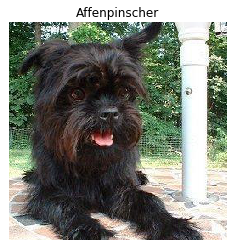

In [56]:
imshow(img_process(train_dir+'001.Affenpinscher/Affenpinscher_00001.jpg'), title='Affenpinscher')

In [57]:
VGG16_predict(train_dir+'001.Affenpinscher/Affenpinscher_00001.jpg')

([252], ['affenpinscher, monkey pinscher, monkey dog'], [0.9544302225112915])

From the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a): 252: 'affenpinscher, monkey pinscher, monkey dog',

### (IMPLEMENTATION) Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained VGG-16 model, we need only check if the pre-trained model predicts an index between 151 and 268 (inclusive).

Use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [58]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    ## TODO: Complete the function.
    prediction = VGG16_predict(img_path)
    
    dog_detected = (prediction[0][0] in range(151, 269))
    
    return dog_detected

In [59]:
dog_detector(train_dir+'001.Affenpinscher/Affenpinscher_00001.jpg')

True

### (IMPLEMENTATION) Assess the Dog Detector

__Question 2:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 


In [60]:
%%time

### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.
def countDogs(ImageList):
    return [dog_detector(img) for img in ImageList]

human_dogs = countDogs(human_files_short)
dog_dogs = countDogs(dog_files_short)

print("{}% of dogs detected in human data".format(sum(human_dogs)))
print("{}% of dogs detected in dogs data".format(sum(dog_dogs)))

1% of dogs detected in human data
99% of dogs detected in dogs data
CPU times: user 2min 29s, sys: 19.7 s, total: 2min 49s
Wall time: 2min 50s


In [61]:
bad_human_dogs = [a for a, b in zip(human_files_short, human_dogs) if b == True]
bad_dog_dogs = [a for a, b in zip(dog_files_short, dog_dogs) if b == False]

In [62]:
for ii in range(len(bad_human_dogs)):
    print(bad_human_dogs[ii])  

/data/lfw/Perri_Shaw/Perri_Shaw_0001.jpg


In [63]:
VGG16_predict(bad_human_dogs[0])

([233], ['Bouvier des Flandres, Bouviers des Flandres'], [0.12169972062110901])

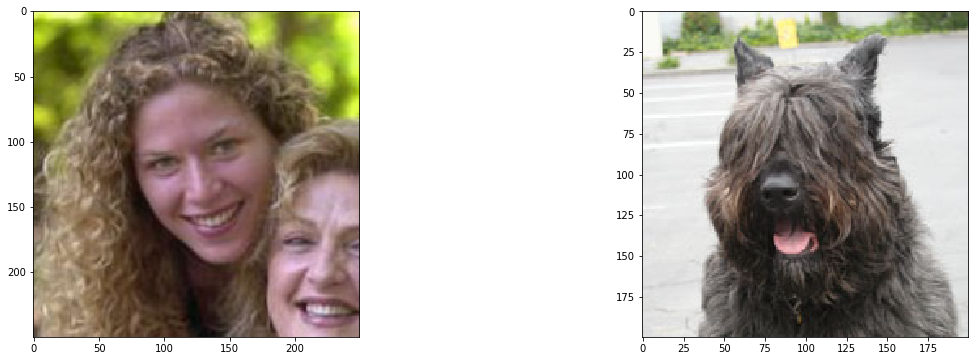

In [64]:
_, axes = plt.subplots(figsize=(20,6), ncols=2)

for ii in range(2):
    ax = axes[ii]
    if ii == 0:
        img = cv2.imread(bad_human_dogs[0])
    else:
        img = cv2.imread(test_dir+'033.Bouvier_des_flandres/Bouvier_des_flandres_02305.jpg') 
    cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(cv_rgb)

In [65]:
for ii in range(len(bad_dog_dogs)):
    print(bad_dog_dogs[ii])  

/data/dog_images/train/059.Doberman_pinscher/Doberman_pinscher_04191.jpg


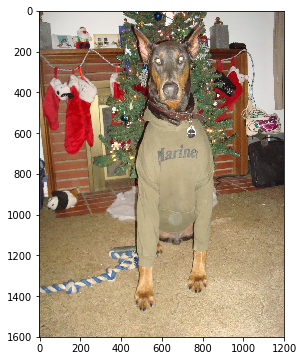

In [66]:
plt.subplots(figsize=(20,6), ncols=1)

img = cv2.imread(bad_dog_dogs[0])
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(cv_rgb)

We suggest VGG-16 as a potential network to detect dog images in your algorithm, but you are free to explore other pre-trained networks (such as [Inception-v3](http://pytorch.org/docs/master/torchvision/models.html#inception-v3), [ResNet-50](http://pytorch.org/docs/master/torchvision/models.html#id3), etc).  Please use the code cell below to test other pre-trained PyTorch models.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [67]:
### (Optional) 
### TODO: Report the performance of another pre-trained network.
### Feel free to use as many code cells as needed.

### Fix bad image - approach 1: 
### Set data to use the workspace versions of the files, then the bad image can be deleted...
- Files must first be copied into appropriate sub-directories...

In [68]:
data_dir  = work_dir + 'dog_images/'
train_dir = data_dir + 'train/'
valid_dir = data_dir + 'valid/'
test_dir  = data_dir + 'test/'

In [69]:
if os.path.isfile(train_dir + '098.Leonberger/Leonberger_06571.jpg'):
    print('Removing',train_dir + '098.Leonberger/Leonberger_06571.jpg')
    os.remove(train_dir + '098.Leonberger/Leonberger_06571.jpg')
else:
    print(train_dir + '098.Leonberger/Leonberger_06571.jpg was not found')  

Removing /home/workspace/data//dog_images/train/098.Leonberger/Leonberger_06571.jpg


### Fix bad image - approach 2: 
### Set data to use the original versions of the files, retain bad image by ImageFile.LOAD_TRUNCATED_IMAGES

In [70]:
from PIL import Image
from PIL import ImageFile 
ImageFile.LOAD_TRUNCATED_IMAGES = True

data_dir  = orig_dir + 'dog_images/'
train_dir = data_dir + 'train/'
valid_dir = data_dir + 'valid/'
test_dir  = data_dir + 'test/'

---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 10%.  In Step 4 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have trouble distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun!

### Use either work directory, or original directory with load truncated images

In [71]:
data_dir  = work_dir + 'dog_images/'
train_dir = data_dir + 'train/'
valid_dir = data_dir + 'valid/'
test_dir  = data_dir + 'test/'

In [72]:
data_dir  = orig_dir + 'dog_images/'
train_dir = data_dir + 'train/'
valid_dir = data_dir + 'valid/'
test_dir  = data_dir + 'test/'

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively).  You may find [this documentation on custom datasets](http://pytorch.org/docs/stable/torchvision/datasets.html) to be a useful resource.  If you are interested in augmenting your training and/or validation data, check out the wide variety of [transforms](http://pytorch.org/docs/stable/torchvision/transforms.html?highlight=transform)!

In [73]:
import os
import torch
from torchvision import datasets, transforms
from PIL import Image
from PIL import ImageFile 
ImageFile.LOAD_TRUNCATED_IMAGES = True

### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes

batch_size = 32 
num_workers = 0   # Using 0 in Dog Project Workspace, otherwise 4
image_size = 224  # 180  

global img_means, img_std

if img_means is not None:
    imgmeans = img_means
else: 
    imgmeans = [0.485, 0.456, 0.406]

if img_std is not None:
    imgstd = img_std
else: 
    imgstd = [0.229, 0.224, 0.225]
        
data_transforms = {
    'train': transforms.Compose([transforms.RandomAffine(15, translate=(0.1, 0.1), scale=(1.0, 1.5), 
                                                         shear=None, resample=Image.BILINEAR, 
                                                         fillcolor=0),
                                 transforms.Resize(image_size + (image_size//7), 
                                                   interpolation=Image.BILINEAR),
                                 transforms.CenterCrop(image_size),
                                 transforms.RandomHorizontalFlip(),
                                 transforms.ColorJitter(brightness=0.3, contrast=0.3, 
                                                        saturation=0.2, hue=0.05), 
                                 transforms.ToTensor(),
                                 transforms.Normalize(imgmeans, imgstd)
                                ]), 
    'valid': transforms.Compose([transforms.Resize(image_size + (image_size//7)),
                                 transforms.CenterCrop(image_size),
                                 transforms.ToTensor(),
                                transforms.Normalize(imgmeans, imgstd)
                                ]),
    'test' : transforms.Compose([transforms.Resize(image_size + (image_size//7)),
                                 transforms.CenterCrop(image_size),
                                 transforms.ToTensor(),
                                 transforms.Normalize(imgmeans, imgstd)
                                ])
}    

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'valid', 'test']}

class_names = image_datasets['train'].classes
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'valid', 'test']}

loaders_scratch = {x: torch.utils.data.DataLoader(image_datasets[x], 
                                              batch_size=batch_size,
                                              shuffle=False if x[:4]=='test' else True, 
                                              num_workers=num_workers)
              for x in ['train', 'valid', 'test']}

In [74]:
class_names

['001.Affenpinscher',
 '002.Afghan_hound',
 '003.Airedale_terrier',
 '004.Akita',
 '005.Alaskan_malamute',
 '006.American_eskimo_dog',
 '007.American_foxhound',
 '008.American_staffordshire_terrier',
 '009.American_water_spaniel',
 '010.Anatolian_shepherd_dog',
 '011.Australian_cattle_dog',
 '012.Australian_shepherd',
 '013.Australian_terrier',
 '014.Basenji',
 '015.Basset_hound',
 '016.Beagle',
 '017.Bearded_collie',
 '018.Beauceron',
 '019.Bedlington_terrier',
 '020.Belgian_malinois',
 '021.Belgian_sheepdog',
 '022.Belgian_tervuren',
 '023.Bernese_mountain_dog',
 '024.Bichon_frise',
 '025.Black_and_tan_coonhound',
 '026.Black_russian_terrier',
 '027.Bloodhound',
 '028.Bluetick_coonhound',
 '029.Border_collie',
 '030.Border_terrier',
 '031.Borzoi',
 '032.Boston_terrier',
 '033.Bouvier_des_flandres',
 '034.Boxer',
 '035.Boykin_spaniel',
 '036.Briard',
 '037.Brittany',
 '038.Brussels_griffon',
 '039.Bull_terrier',
 '040.Bulldog',
 '041.Bullmastiff',
 '042.Cairn_terrier',
 '043.Canaan_do

In [75]:
class_len = len(class_names)
class_len

133

In [76]:
dataset_sizes

{'train': 6679, 'valid': 835, 'test': 836}

Create a tensor of class weights in case I want to cope with class imbalances...

In [77]:
from collections import defaultdict
class_counts = defaultdict(int)
for _, c in image_datasets["train"].imgs:
    class_counts[c] += 1

class_weights = [1-(float(class_counts[class_id])/len(image_datasets["train"].imgs))
                 for class_id in range(len(image_datasets["train"].classes))]
class_weights = torch.FloatTensor(class_weights)
class_weights.to(device)

tensor([ 0.9904,  0.9913,  0.9922,  0.9906,  0.9885,  0.9904,  0.9925,
         0.9901,  0.9949,  0.9925,  0.9901,  0.9901,  0.9931,  0.9897,
         0.9891,  0.9912,  0.9907,  0.9925,  0.9928,  0.9907,  0.9904,
         0.9930,  0.9903,  0.9907,  0.9945,  0.9939,  0.9904,  0.9948,
         0.9889,  0.9922,  0.9916,  0.9903,  0.9933,  0.9904,  0.9921,
         0.9903,  0.9925,  0.9915,  0.9897,  0.9921,  0.9897,  0.9906,
         0.9925,  0.9904,  0.9921,  0.9900,  0.9919,  0.9919,  0.9925,
         0.9925,  0.9907,  0.9927,  0.9930,  0.9915,  0.9925,  0.9903,
         0.9894,  0.9925,  0.9930,  0.9910,  0.9909,  0.9921,  0.9921,
         0.9942,  0.9937,  0.9951,  0.9949,  0.9906,  0.9924,  0.9930,
         0.9907,  0.9928,  0.9937,  0.9939,  0.9934,  0.9904,  0.9936,
         0.9940,  0.9912,  0.9931,  0.9916,  0.9909,  0.9931,  0.9925,
         0.9945,  0.9921,  0.9901,  0.9924,  0.9921,  0.9913,  0.9915,
         0.9934,  0.9948,  0.9934,  0.9927,  0.9936,  0.9925,  0.9933,
      

**Question 3:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?
- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?


**Answer**:  

The dataloaders process images via Pytorch datasets, which incorporate Pytorch transforms on the images.

Each transforms resizes images to a maximum that allows for a subsequent center crop to reduce the image size to the desired value.

A custom normalisation can be used via the variables img_means and img_std, but ImageNet normalization is used by default if these variables are None.

Additionally, the train transforms employs image augmentation which incorporates RandomAffine for rotation and stretching the image, and uses color jitter to introduce color and brightness variations. This is important to increase the variation of training images which will help prevent overfitting.

An initial image size of 180x180 was chosen as a smaller size allows for more reasonable batch sizes and faster processing, important when testing a network being trained from scratch. This was subsequently adjusted up to 224x224 once a useful architecture was deduced, to conform with an expected ImageNet size.

A tensor of class weights was created in case it's required to offset class imbalances.

I am using num_workers at 0 in the Dog Project workspace as I get an error allocating memory with a higher setting. On my personal system I use 4, which loads the data three to four times faster (GPU is also faster on the PC)...

---

### Preparation and notes for the CNN construction...

I have implmented an apdaptive pooling approach for the classifier, which allows me to simply specify the desired output to the classifier without having to do a calculation and hard-wiring the incoming tensor size. See Jeremy Howard's [nn tutorial](https://pytorch.org/tutorials/beginner/nn_tutorial.html) for a mention of this, where he says _"replace nn.AvgPool2d with nn.AdaptiveAvgPool2d, which allows us to define the size of the output tensor we want, rather than the input tensor we have. As a result, our model will work with any size input"_. 

The advantage of this approach is not only that any image size can be freely used, but that in allowing that ability image sizes can be altered during learning, which has been [noted](https://www.youtube.com/watch?v=JNxcznsrRb8&feature=youtu.be&t=1h32m45s) to wake up the process and allow another step of model improvement, [reducing overfitting](https://forums.fast.ai/t/what-are-your-favorite-ways-to-reduce-overfitting/8620/2?u=chris_palmer). I used this to good effect in my model used for the Pytorch Challenge.

I have created a version of the approach taken by fast.ai, where a class AdaptiveConcatPool2d is defined that combines an AdaptiveAvgPool2d with a AdaptiveMaxPool2d, this has the advantage of allowing the model to learn from maximum values as well as averge ones. See more detailed discussions in the following links.

#### FASTAI CNN head structure
[What goes on behind in the fastai library?](https://forums.fast.ai/t/lesson-1-learner-what-goes-on-behind-in-the-fastai-library/29346)  
[What is the distinct usage of the AdaptiveConcatPool2d layer?](https://forums.fast.ai/t/what-is-the-distinct-usage-of-the-adaptiveconcatpool2d-layer/7600/3)

In [78]:
# Adapted from fastai...
import torch.nn as nn

class AdaptiveConcatPool2d(nn.Module):
    def __init__(self, sz=None):
        super().__init__()
        sz = sz or (1,1)
        self.ap = nn.AdaptiveAvgPool2d(sz)
        self.mp = nn.AdaptiveMaxPool2d(sz)
    def forward(self, x): return torch.cat([self.mp(x), self.ap(x)], 1)

https://discuss.pytorch.org/t/non-legacy-view-module/131/8

In [79]:
class Flatten(nn.Module):
    def __init__(self):
        super(Flatten, self).__init__()

    def forward(self, x):
        x = x.view(x.size(0), -1)
        return x

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  Use the template in the code cell below.

## 3 layer CNN with starting kernel 5 and 48-96-128 node layers
- this was the most succesful architecture in terms of accuracy gained per epoch
- this model's state dict is saved as model_scratch.pt
- chart of results from this model are printed below
- See Appendix for output of first 300 epochs
- see Appendix for other models tried

In [80]:
import torch.nn as nn
import torch.nn.functional as F

# define the CNN architecture
class Net(nn.Module):
    ### TODO: choose an architecture, and complete the class
    def __init__(self, num_classes=133):
        super(Net, self).__init__()
        ## Define layers of a CNN
        self.layer1 = nn.Sequential(
            nn.Conv2d(3, 48, kernel_size=5, stride=1, padding=2, bias=False),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        )
        self.layer2 = nn.Sequential(
            nn.Conv2d(48, 96, kernel_size=3, stride=1, padding=1, bias=False),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=1, padding=0)
        )
        self.layer3 = nn.Sequential(
            nn.Conv2d(96, 128, kernel_size=3, stride=1, padding=1, bias=False),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=1, padding=0)
        )
        self.classifier = nn.Sequential(
            AdaptiveConcatPool2d(),
            Flatten(),
            nn.BatchNorm1d(128*2, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            nn.Dropout(p=0.25),
            nn.Linear(in_features=128*2, out_features=512, bias=True),
            nn.ReLU(),
            nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            nn.Dropout(p=0.25),
            nn.Linear(in_features=512, out_features=num_classes, bias=True)
        )    
        
        
    def forward(self, x):
        ## Define forward behavior
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.classifier(x)

        return x

#-#-# You so NOT have to modify the code below this line. #-#-#

# instantiate the CNN
model_scratch = Net()

# move tensors to GPU if CUDA is available
if use_cuda:
    model_scratch.cuda()

In [81]:
print(model_scratch)

Net(
  (layer1): Sequential(
    (0): Conv2d(3, 48, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (layer2): Sequential(
    (0): Conv2d(48, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=1, padding=0, dilation=1, ceil_mode=False)
  )
  (layer3): Sequential(
    (0): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=1, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): AdaptiveConcatPool2d(
      (ap): AdaptiveAvgPool2d(output_size=(1, 1))
      (mp): AdaptiveMaxPool2d(output_size=(1, 1))
    )
    (1): Flatten()
    (2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.25)
    (4): Linear(in_features=256, out_features=512, 

### summary below requires torchsummary...
- load torchsummary if wanting to execute the summary cell

In [82]:
!pip install torchsummary
from torchsummary import summary

You are using pip version 9.0.1, however version 19.0.2 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [83]:
summary(model_scratch, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 48, 224, 224]           3,600
              ReLU-2         [-1, 48, 224, 224]               0
         MaxPool2d-3         [-1, 48, 112, 112]               0
            Conv2d-4         [-1, 96, 112, 112]          41,472
              ReLU-5         [-1, 96, 112, 112]               0
         MaxPool2d-6         [-1, 96, 111, 111]               0
            Conv2d-7        [-1, 128, 111, 111]         110,592
              ReLU-8        [-1, 128, 111, 111]               0
         MaxPool2d-9        [-1, 128, 110, 110]               0
AdaptiveMaxPool2d-10            [-1, 128, 1, 1]               0
AdaptiveAvgPool2d-11            [-1, 128, 1, 1]               0
AdaptiveConcatPool2d-12            [-1, 256, 1, 1]               0
          Flatten-13                  [-1, 256]               0
      BatchNorm1d-14                

__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  

__Answer:__ 

This was very much a trial and error process, and even then I know that there must be many better ideas than the ones I settled on. I am not yet familiar enough with the domain to know _exactly_ what I should do...

Firstly I set up fairly deep network based on the initial layers of resnet18, but I found it was not progressing at all well, so I went back to basics and tried the following configurations, on the basis that increasing the CNN complexity and regularization should be beneficial up to a point, after which training the network requires more resources and knowledge than I can apply, and there is no further benefit.

Configurations assessed:
- 3 layers: 32, 64, 96 node configuration 
- 3 layers: 32, 64, 96 node configuration and batch normalization
- 3 layers: 48, 96, 128 node configuration
- 4 layers: 32, 64, 96, 128 node configuration
- 6 layers: 32 & 32, 64 & 64, 96 & 96 node configuration and batch normalization, 
    - i.e. 3 layers each with 2 x Conv2d per layer

**Summary of Results:**  
The best performing network for accuracy was the 48, 96, 128 node network, which I describe below, but some key points are that
- The smaller configuration of 32, 64, 96 trained more quickly and was only slightly worse (27% vs 29% test accuracy after 300 epochs)   
- Batch normalization did not improve accuracy rather it smoothed the relationship between training and validation loss and in fact took longer to reach the same accuracy   
- The 4 layer configuration failed to make any useful progress, the 6 layer (3 x 2) configuration took a lot longer to train and did not perform as well - though with more training it might have kept performing.

**Kernel Size:**  
Kernel size of the first layer was tested at 3, 5, and 7. A single kernel size of 3 did not perform as well as a single kernel of 5 in these configurations, but 7 was very difficult to train needing more resources than I had to make progess with it. Two size 3 kernels also demanded more resources than I had - though this may have been more to do with other aspects of that model's architecture.

Discussions [1](https://www.reddit.com/r/MachineLearning/comments/47ugeo/question_why_have_large_convolutional_kernels/), [2](https://forums.fast.ai/t/kernel-size-why-would-you-ever-make-it-larger/8205) regarding kernel size indicate that two stacked 3x3 kernels are a standard and a better choice than a single 5x5 kernel, so given time and [more understanding](https://cs.nyu.edu/~fergus/papers/zeilerECCV2014.pdf) I would like to revisit this and resolve the issues I had with this architecture.


**Architecture of 48, 96, 128 CNN:**  
```
Net(
  (layer1): Sequential(
    (0): Conv2d(3, 48, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (layer2): Sequential(
    (0): Conv2d(48, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=1, padding=0, dilation=1, ceil_mode=False)
  )
  (layer3): Sequential(
    (0): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=1, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): AdaptiveConcatPool2d(
      (ap): AdaptiveAvgPool2d(output_size=(1, 1))
      (mp): AdaptiveMaxPool2d(output_size=(1, 1))
    )
    (1): Flatten()
    (2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.25)
    (4): Linear(in_features=256, out_features=512, bias=True)
    (5): ReLU()
    (6): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): Dropout(p=0.25)
    (8): Linear(in_features=512, out_features=133, bias=True)
  )
)
```

**Explanation of architecture:**

- Reading about CNN architecture suggested that a 3 layer network would be a minimum, so that was my minimum configuration. After assessing variations including 3 layers of 2 convolutions and 4 layers of single convolutions I settled on a simple 3 layer model.
- Kernel size in the first layer was set to 5 (though a kernel size of 3 and of 2x3 were also tested) as I wanted to capture enough features of the images and still have a trainable network within my recources.
- With kernel size of 5 I used padding of 2 in the Conv2d layer, this is required to sample the image fully with this kernel size.
- Subsequent Conv2d layers were given kernel size of 3 - this is a standard part of the image processing pipeline.
- In keeping with the requirement of a neural network every convultion is followed by a linearity, in this case the ReLU activation function.
- Each layer finishes with a max pooling using MaxPool2d, which is a standard step to down-sample the data as it moves through the network.
- Although this network doesn't use it I evaluated using batch normalization on each layer, but as noted above did not usefully benefit from it, so ommitted it.
- The classifier is described in detail above in the section "Preparation and notes for the CNN construction" - I have used a variation of AdaptiveAverage pooling that allows me to configure the classifier in terms of its outputs, for reasons of flexibilty in using different image sizes. This has downstream advantages of allowing me to train initially on smaller images and consequent larger batch sizes while developing an understanding of the network; and later in the prevention of overfitting by introducing gradual image size increases and so obtaining a greater accuracy.
- Futhermore, by combining AdaptiveAvgPool2d with an AdaptiveMaxPool2d (wrapped in class AdaptiveConcatPool2d) the model can learn from maximum values as well as average values.
- The flatten layer of the classifier makes the data digestible for the linear layers.
- Batch normalization and dropout are added to assist in regularizing the work of the linear classifier layers, so preventing overfiitting.
- I didn't wrap the output in a softmax as I intended to use the CrossEntropyLoss loss function.




**Set use_weights to True if wanting to use the weights to compensate for class imbalance**

In [84]:
use_weights = False

---

In [85]:
learning_rate = 1e-5

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_scratch`, and the optimizer as `optimizer_scratch` below.

In [86]:
import torch.optim as optim

### TODO: select loss function
if use_weights:
    criterion_scratch = nn.CrossEntropyLoss(weight=class_weights.to(device), reduction='sum')
else:    
    criterion_scratch = nn.CrossEntropyLoss()

### TODO: select optimizer
optimizer_scratch = torch.optim.Adam(model_scratch.parameters(), lr=learning_rate)

## Establish best learning rate

Code adapted from Sylvain Gugger's [How Do You Find A Good Learning Rate](https://sgugger.github.io/how-do-you-find-a-good-learning-rate.html)

## A note about using the learning rate finder
Testing the model with the learning rate finder will leave it with weights already set, so I have found that after finding the learning rate I need to re-create the model to start with a clean slate.

In [87]:
import math

def find_lr(model, optimizer, criterion, dataloaders, init_value = 1e-8, 
            final_value=10., beta = 0.98):
    num = len(dataloaders['train'])-1
    mult = (final_value / init_value) ** (1/num)
    lr = init_value
    optimizer.param_groups[0]['lr'] = lr
    avg_loss = 0.
    best_loss = 0.
    batch_num = 0
    losses = []
    log_lrs = []
    
    for images, labels in dataloaders['train']:
        batch_num += 1
        
        #Get the loss for this mini-batch of images/outputs
        images = images.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        output = model.forward(images)
        
        loss = criterion(output, labels)
        
        #Compute the smoothed loss
        avg_loss = beta * avg_loss + (1-beta) * loss.item()
        smoothed_loss = avg_loss / (1 - beta**batch_num)
        
        #Stop if the loss is exploding
        if batch_num > 1 and smoothed_loss > 4 * best_loss:
            return log_lrs, losses
        
        #Record the best loss
        if smoothed_loss < best_loss or batch_num==1:
            best_loss = smoothed_loss
        
        #Store the values
        losses.append(smoothed_loss)
        log_lrs.append(math.log10(lr))
        
        #Do the SGD step
        loss.backward()
        optimizer.step()
        
        #Update the lr for the next step
        lr *= mult
        optimizer.param_groups[0]['lr'] = lr
    
    return log_lrs, losses
    

In [88]:
with active_session():
    logs, losses = find_lr(model_scratch, optimizer_scratch, criterion_scratch, loaders_scratch)

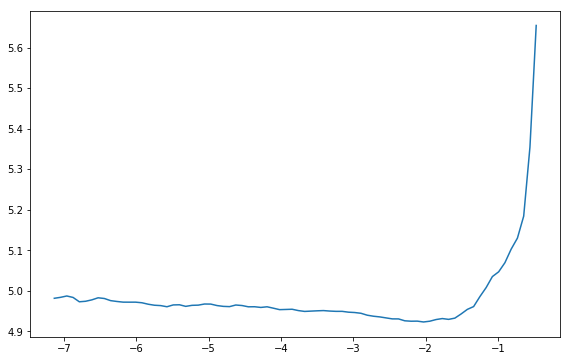

In [89]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(logs[10:-5],losses[10:-5])

The learning rate finder is a little hard to interpret, but probably `1e-5` is a good choice...

In [90]:
print("{:.10f}".format(1e-05))
print("{:.10f}".format(1e-06))
print("{:.10f}".format(1e-07))

0.0000100000
0.0000010000
0.0000001000


In [91]:
learning_rate = 1e-05

### Resetting optimzer to use learning rate calculated by the finder...

In [92]:
optimizer_scratch = torch.optim.Adam(model_scratch.parameters(), lr=learning_rate)

In [93]:
get_learning_rate(optimizer_scratch)

[1e-05]

Some of the code used below was adapted from https://pytorch.org/tutorials/beginner/finetuning_torchvision_models_tutorial.html

### Run next cell before running def train below, and to clear variables for a new run...

In [94]:
train_losses, valid_losses, train_acc_history, val_acc_history, lr_hist = [], [], [], [], [] 
best_acc, best_val_epoch, best_acc_epoch, epoch_loss_min = 0.0, 0, 0, np.Inf

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_scratch.pt'`.

In [95]:
def train(n_epochs, loaders, model, optimizer, criterion, use_cuda, save_path, 
          use_weights=False):
    """Returns trained model"""

    global train_losses, valid_losses, val_acc_history, lr_hist
    global best_acc, best_val_epoch, best_acc_epoch, epoch_loss_min
    
    curr_lr = get_learning_rate(optimizer)
    
    best_model_wts = copy.deepcopy(model.state_dict())
    best_optim_wts = copy.deepcopy(optimizer.state_dict())
    
    since = time.time()

    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
    # also track maximum accuracy...
    valid_acc_max  = 0
    
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        valid_acc  = 0.0
        
        ###################
        # train the model #
        ###################
        model.train()
        
        running_loss = 0.0
        running_corrects = 0        

        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
                
            ## find the loss and update the model parameters accordingly
            optimizer.zero_grad()
            
            outputs = model(data)
            
            loss = criterion(outputs, target)
            
            _, preds = torch.max(outputs, 1)
            
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * (1 if use_weights==True else data.size(0))
            running_corrects += torch.sum(preds == target.data)
                
            ## Suggested approach from the project workbook...
            ## record the average training loss, using something like
            train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            
        epoch_loss = running_loss / dataset_sizes['train']
        epoch_acc = running_corrects.double() / dataset_sizes['train']

        train_losses.append(epoch_loss)
        train_acc_history.append(epoch_acc)
        
        curr_lr = get_learning_rate(optimizer)
        lr_hist.append(curr_lr)        

        ######################    
        # validate the model #
        ######################
        model.eval()

        running_loss = 0.0
        running_corrects = 0
            
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            
            ## update the average validation loss
            val_outputs = model(data)
            
            val_loss = criterion(val_outputs, target)

            _, preds = torch.max(val_outputs, 1)
            
            running_loss += val_loss.item() * (1 if use_weights==True else data.size(0))
            running_corrects += torch.sum(preds == target.data)
            
            valid_loss = valid_loss + ((1 / (batch_idx + 1)) * (val_loss.data - valid_loss))
  
        epoch_val_loss = running_loss / dataset_sizes['valid']
        epoch_val_acc = running_corrects.double() / dataset_sizes['valid']
        
        valid_losses.append(epoch_val_loss)
        val_acc_history.append(epoch_val_acc.item()) 
        
        # print training/validation statistics 
# Tested and found that these calculations render identical results, so keeping my approach...        
#         print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
#             epoch, 
#             train_loss,
#             valid_loss
#             ))
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            epoch_loss,
            epoch_val_loss
            ))        
        print('Epoch: {} \tTraining Accuracy: {:.6f} \tValidation Accuracy: {:.6f}'.format(
            epoch, 
            epoch_acc,
            epoch_val_acc
            ))  
        
        ## TODO: save the model if validation loss has decreased
        if epoch_val_acc > best_acc:
            filename = save_path + '_acc' # + "_" + str(epoch)
            print('Accuracy has increased ({:.6f} --> {:.6f})  Saving model as {}...'.format(
                best_acc, epoch_val_acc, filename))            

            best_acc_epoch = epoch 
            best_acc = epoch_val_acc
            
            best_model_wts = copy.deepcopy(model.state_dict())
            best_optim_wts = copy.deepcopy(optimizer.state_dict())
            
            torch.save(best_model_wts, filename + '.pt')
            torch.save(best_optim_wts, filename + '_optimizer.pt') 
                
        if epoch_val_loss <= epoch_loss_min:
            filename = save_path + '_val' # + "_" + str(epoch)
            print('Validation loss decreased ({:.6f} --> {:.6f})  Saving model as {}...'.format(
            epoch_loss_min, epoch_val_loss, filename))
                
            best_val_epoch = epoch           
            epoch_loss_min = epoch_val_loss
            
            torch.save(model.state_dict(), filename + '.pt')
            torch.save(optimizer.state_dict(), filename + '_optimizer.pt')            
        
        print()
        
    time_elapsed = time.time() - since
    
    print()
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best validation accuracy: {:4f}'.format(best_acc))
    print('Best accuracy epoch     : {}'.format(best_acc_epoch))
    print('Best validation loss    : {:4f}'.format(epoch_loss_min))
    print('Best validation epoch   : {}'.format(best_val_epoch))
    
    # load best accuracy model weights
    model.load_state_dict(best_model_wts)
    optimizer.load_state_dict(best_optim_wts)
    
# Not automatically overwriting model_scratch state_dict as this may not be the best model...
#     # Save to required model_scratch
#     torch.save(model.state_dict(), save_path + '.pt')
#     torch.save(optimizer.state_dict(), save_path + '_optimizer.pt') 

    # return trained model
    return model

### Enable as code cell and run if wanting to reset global variables

## Training cell below
- Model finishes with best accuracy state dict loaded
- To save the model's state dict as `model_scratch.pt` use the following cell
- To reload `model_scratch.pt` use the separate cell below
- See charts of 490 epochs training, to get to 37% test accuracy
- See Appendix for output of the first 300 epochs of the 48-96-128 model

In [96]:
with active_session():
    # train the model
    model_scratch = train(300, loaders_scratch, model_scratch, optimizer_scratch, 
                          criterion_scratch, use_cuda, 'model_scratch')

# load the model that got the best validation accuracy
#model_scratch.load_state_dict(torch.load('model_scratch.pt'))

### Run to overwrite required model_scratch state dict file with this model's state dict

In [97]:
# Save to required model_scratch
torch.save(model_scratch.state_dict(), 'model_scratch.pt')
torch.save(optimizer_scratch.state_dict(), 'model_scratch_optimizer.pt') 

### Run to load model_scratch state dict if needed...

In [98]:
model_scratch.load_state_dict(torch.load('model_scratch.pt'))
optimizer_scratch.load_state_dict(torch.load('model_scratch_optimizer.pt'))

---

## Chart training losses and accuracy

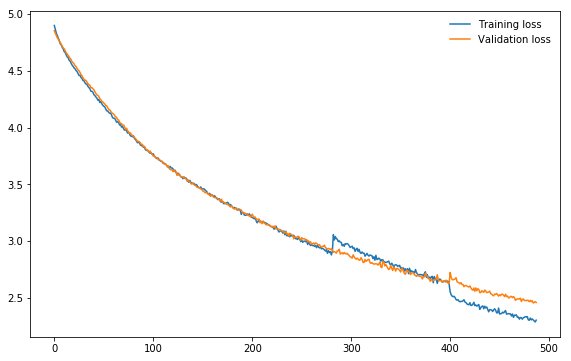

In [99]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(train_losses[2:], label="Training loss")
plt.plot(valid_losses[2:], label="Validation loss")
plt.legend(frameon=False)
plt.show()

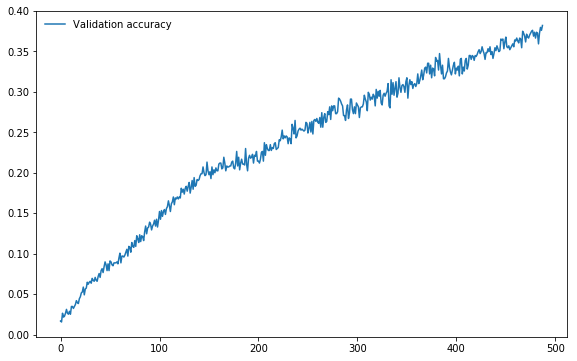

In [100]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(val_acc_history[2:], label="Validation accuracy")
plt.legend(frameon=False)
plt.show()

---

## Reload previous best model if required...

**Using reloadModel to restore model and optimizer from best accuracy state_dicts, and also restore tracking values...**

**NOTE:** When loading a state dict saved under Pytorch 1.0 in a Pytorch 0.4.0 environment an error occurs re unexpected keys:
```
RuntimeError: Error(s) in loading state_dict for Net:
	Unexpected key(s) in state_dict: "layer1.4.num_batches_tracked", "layer2.4.num_batches_tracked", "layer3.4.num_batches_tracked", "classifier.2.num_batches_tracked", "classifier.6.num_batches_tracked". 
```
See [Loading part of a pre-trained model](https://discuss.pytorch.org/t/how-to-load-part-of-pre-trained-model/1113/2), so when reloading a state dict prepared in v 1.0 load it in stages, executing the code in the cell below instead of just ` model.load_state_dict()`...

In [101]:
!dir

dog_app-cn.ipynb		   model_scratch_optimizer.pt
dog_app.ipynb			   model_scratch.pt
dog_app_Working.ipynb		   model_scratch_val_optimizer.pt
haarcascades			   model_scratch_val.pt
imagenet1000_clsidx_to_labels.txt  model_transfer_optimizer.pt
images				   model_transfer.pt
model_1cycle_1.pth		   README.md
model_d_502.pth			   resnet50_36.pth
model_scratch_acc_optimizer.pt	   state_dicts
model_scratch_acc.pt		   workspace_utils.py


In [102]:
state_dicts_name = 'model_d_502.pth'
learning_rate=1e-05
reloadModel(model_scratch, optimizer_scratch, state_dicts_name, learning_rate, isV1=True)

**...or, just reloading models and optimizer from either best accuracy or best validation state_dicts**

**Accuracy...**

In [103]:
best_model_wts = torch.load("model_scratch_acc.pt", 
                            map_location=lambda storage, loc: storage)
best_optim_wts = torch.load("model_scratch_acc_optimizer.pt", 
                            map_location=lambda storage, loc: storage)

**or Loss...**

In [104]:
best_model_wts = torch.load("model_scratch_val.pt", 
                            map_location=lambda storage, loc: storage)
best_optim_wts = torch.load("model_scratch_val_optimizer.pt",
                            map_location=lambda storage, loc: storage)

---

**Load state dicts into optimizer and model...**

In [105]:
optimizer_scratch.load_state_dict(best_optim_wts)

In [106]:
model_scratch.load_state_dict(best_model_wts)
model_scratch.eval();

**or, loading a v1.0 state dict...**

In [107]:
model_dict = model_scratch.state_dict()
pretrained_dict = {k: v for k, v in best_model_wts.items() if k in model_dict}
model_dict.update(pretrained_dict) 
model_scratch.load_state_dict(pretrained_dict)
model_scratch.eval();

---

### Save model state dict to specified name model_scratch.pt if needed

## Save checkpoint dictionary if needed

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images.  Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 10%.
   
<a id='defTest'></a>

In [108]:
def test(loaders, model, criterion, use_cuda):

    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.

    model.eval()
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)
            
    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct / total, correct, total))

In [109]:
# call test function    
%time test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)

Test Loss: 2.503274


Test Accuracy: 37% (316/836)
CPU times: user 16.6 s, sys: 3.05 s, total: 19.7 s
Wall time: 17.9 s


## Results of 3 layer CNN

### 48-96-128 configuration

(15% accuracy at 103 epochs, 29% (243/836) after 300 epochs), 37% (316/836) after 490 epochs

**Model was run to 285 epochs with 224 size images, then switched to 299 size until epoch 400, then back to 224 to 490 epochs...**
- Image size change had a positive effect on the accuracy, which was stalling somewhat before each change 
- My GPU has limited memory, limiting batch size; this could have worked in fewer epochs had I been able to increase the batch size

### 1. Test results
```
Test Loss: 2.503274
Test Accuracy: 37% (316/836)
```
### 2. Run results
```
Best validation accuracy: 0.382036
Best accuracy epoch     : 490
Best validation loss    : 2.434461
Best validation epoch   : 499
```

### 3. Loss chart and Accuracy charts
<img src="images/3_layer_cnn_128_490_loss.PNG" width="550" align="left">      
 
<img src="images/3_layer_cnn_128_490_accuracy.PNG" width="550" align="left">  

## Results of 3 layer CNN

### 32-64-96 configuration

(15% accuracy at 105 epochs, 27% (228/836) after 300 epochs)

### 1. Test results
```
Test Loss: 3.024790
Test Accuracy: 27% (228/836)
```
### 2. Run results

#### Run 1
```
Training complete in 141m 46s
Best validation accuracy: 0.146108
Best accuracy epoch     : 99
Best validation loss    : 3.840200
Best validation epoch   : 100
```
#### Run 2
```
Training complete in 136m 32s
Best validation accuracy: 0.231138
Best accuracy epoch     : 199
Best validation loss    : 3.267654
Best validation epoch   : 199
```
#### Run 3
```
Training complete in 140m 10s
Best validation accuracy: 0.285030
Best accuracy epoch     : 297
Best validation loss    : 2.968024
Best validation epoch   : 300
```

### 3. Loss chart and Accuracy charts
<img src="images/3_layer_cnn_loss.JPG" width="550" align="left">  
 
<img src="images/3_layer_cnn_accuracy.JPG" width="550" align="left">  

## Results of 3 layer CNN with batch normalization

(15% accuracy at 105 epochs, 26% (225/836) after 300 epochs)

### 1. Test Results
```
Test Loss: 3.085338
Test Accuracy: 26% (225/836)
```

### 2. Run results
```
Training complete in 442m 23s
Best validation accuracy: 0.267066
Best accuracy epoch     : 291
Best validation loss    : 2.988656
Best validation epoch   : 299
```

### 3. Loss chart and Accuracy charts
<img src="images/3_layer_cnn_bn_loss.JPG" width="550" align="left">  
 
<img src="images/3_layer_cnn_bn_accuracy.JPG" width="550" align="left">  


## Results of 6 layer CNN

(15% accuracy at 150 epochs)

### 6 layer CNN training summary

1. Training 100 epochs in the Udacity workspace took around 9.1 hours, on a PC with a GTX1080 the task took 2.2 hours!
2. Initialized the model trained here with state dicts obtained from the PC after 50 epochs
3. Therefore results here are after 150 epochs, with validation accuracy at 16.5%
```
Training complete in 548m 1s
Best validation accuracy: 0.165269
Best accuracy epoch     : 98  (actually 148)
Best validation loss    : 3.677971
Best validation epoch   : 100 (actually 150)
```
4. After 150 epochs the 6 layer CNN gets 15% test accuracy (132/836)  
```
Test Loss: 3.738435
Test Accuracy: 15% (132/836)
```

---
<a id='step4'></a>
## Step 4: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/master/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively). 

If you like, **you are welcome to use the same data loaders from the previous step**, when you created a CNN from scratch.

In [110]:
## TODO: Specify data loaders
import os
from PIL import Image
from PIL import ImageFile
from torchvision import datasets, transforms
ImageFile.LOAD_TRUNCATED_IMAGES = True

# data_dir  = work_dir + 'dog_images/'
# train_dir = data_dir + 'train/'
# valid_dir = data_dir + 'valid/'
# test_dir  = data_dir + 'test/'

data_dir  = orig_dir + 'dog_images/'
train_dir = data_dir + 'train/'
valid_dir = data_dir + 'valid/'
test_dir  = data_dir + 'test/'

batch_size = 128 
num_workers = 0 ## only 0 works in workspace...
image_size = 224 

global img_means, img_std

if img_means is not None:
    imgmeans = img_means
else: 
    imgmeans = [0.485, 0.456, 0.406]

if img_std is not None:
    imgstd = img_std
else: 
    imgstd = [0.229, 0.224, 0.225]
        
data_transforms = {
    'train': transforms.Compose([transforms.RandomAffine(15, translate=(0.1, 0.1), scale=(1.0, 1.5), 
                                                         shear=None, resample=Image.BILINEAR, 
                                                         fillcolor=0),
                                 transforms.Resize(image_size + (image_size//7), 
                                                   interpolation=Image.BILINEAR),
                                 transforms.CenterCrop(image_size),
                                 transforms.RandomHorizontalFlip(),
                                 transforms.ColorJitter(brightness=0.3, contrast=0.3, 
                                                        saturation=0.2, hue=0.05), 
                                 transforms.ToTensor(),
                                 transforms.Normalize(imgmeans, imgstd)
                                ]), 
    'valid': transforms.Compose([transforms.Resize(image_size + (image_size//7)),
                                 transforms.CenterCrop(image_size),
                                 transforms.ToTensor(),
                                transforms.Normalize(imgmeans, imgstd)
                                ]),
    'test' : transforms.Compose([transforms.Resize(image_size + (image_size//7)),
                                 transforms.CenterCrop(image_size),
                                 transforms.ToTensor(),
                                 transforms.Normalize(imgmeans, imgstd)
                                ])
}    

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'valid', 'test']}

class_names = image_datasets['train'].classes
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'valid', 'test']}

loaders_transfer = {x: torch.utils.data.DataLoader(image_datasets[x], 
                                              batch_size=batch_size,
                                              shuffle=False if x[:4]=='test' else True, 
                                              num_workers=num_workers)
              for x in ['train', 'valid', 'test']}

### Use [ImageFolderWithPaths](https://gist.github.com/andrewjong/6b02ff237533b3b2c554701fb53d5c4d) wrapper as alternative datasets and loaders 
#### so we can get paths if needed
 
Seems to only work with num_workers = 0

In [111]:
class ImageFolderWithPaths(datasets.ImageFolder):
    """Custom dataset that includes image file paths. Extends
    torchvision.datasets.ImageFolder
    """

    # override the __getitem__ method. this is the method dataloader calls
    def __getitem__(self, index):
        # this is what ImageFolder normally returns 
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        # the image file path
        path = self.imgs[index][0]
        # make a new tuple that includes original and the path
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path

In [112]:
test_datasets = {x: ImageFolderWithPaths(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['valid', 'test']}

test_dataloaders = {x: torch.utils.data.DataLoader(test_datasets[x], 
                                              batch_size=batch_size,
                                              shuffle=False)
              for x in ['valid', 'test']}

### (IMPLEMENTATION) Model Architecture

Use transfer learning to create a CNN to classify dog breed.  Use the code cell below, and save your initialized model as the variable `model_transfer`.

In [113]:
import torchvision.models as models
import torch.nn as nn

## TODO: Specify model architecture 
class AdaptiveConcatPool2d(nn.Module):
    def __init__(self, sz=None):
        super().__init__()
        sz = sz or (1,1)
        self.ap = nn.AdaptiveAvgPool2d(sz)
        self.mp = nn.AdaptiveMaxPool2d(sz)
    def forward(self, x): return torch.cat([self.mp(x), self.ap(x)], 1)

class Flatten(nn.Module):
    def __init__(self):
        super(Flatten, self).__init__()

    def forward(self, x):
        x = x.view(x.size(0), -1)
        return x
    
def get_resnet_model(modelname='resnet50', swap=False, sm=False):
    if modelname == 'resnet18':
        model = models.resnet18(pretrained=True)   
    elif modelname == 'resnet34':    
        model = models.resnet34(pretrained=True)   
    elif modelname == 'resnet50':    
        model = models.resnet50(pretrained=True)
    elif modelname == 'resnet101':    
        model = models.resnet101(pretrained=True)
    elif modelname == 'resnet152':    
        model = models.resnet152(pretrained=True)
    else:
        model = models.resnet50(pretrained=True)
        
    for param in model.parameters():
        param.requires_grad = False    
        
    clf_input_size = model.fc.in_features
    clf_output_size = 133 # len(class_names)
    nf = clf_input_size * 2 # For flattening ...
    
    if swap==True:
        # swapping last 2 layers for new ones - adaptive max pooling and 
        # more linear layers with dropout
        Resnetlayers = []
        Resnetlayers.append(AdaptiveConcatPool2d())
        Resnetlayers.append(Flatten())
        Resnetlayers.append(nn.BatchNorm1d(nf, eps=1e-05, momentum=0.1, affine=True, 
                                           track_running_stats=True))
        Resnetlayers.append(nn.Dropout(p=0.25))
        Resnetlayers.append(nn.Linear(in_features=nf, out_features=512, bias=True))
        Resnetlayers.append(nn.ReLU())
        Resnetlayers.append(nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, 
                                           track_running_stats=True))
        Resnetlayers.append(nn.Dropout(p=0.25))
        Resnetlayers.append(nn.Linear(in_features=512, out_features=clf_output_size, 
                                      bias=True))        
        if sm==True:
            Resnetlayers.append(nn.LogSoftmax())
            
        Resnetlist = list(model.children())[:-2] + Resnetlayers
        model = torch.nn.Sequential(*Resnetlist)
    else:    
        # standard replacing the fc layer to suit the number of classes
        classifier = nn.Linear(clf_input_size, clf_output_size)
        model.fc = classifier

    return model

model_name = "resnet152"

model_transfer = get_resnet_model(model_name, swap=False, sm=False)

if use_cuda:
    model_transfer = model_transfer.cuda()

Downloading: "https://download.pytorch.org/models/resnet152-b121ed2d.pth" to /root/.torch/models/resnet152-b121ed2d.pth
100%|██████████| 241530880/241530880 [00:04<00:00, 59502451.84it/s]


In [114]:
print(model_transfer)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=F

__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__ 

- A resnet50 pre-trained ImageNet model was chosen:
    - an ImageNet model was an obvious choice for transfer learning 
    - the resnet architecture was picked because of previous familiarity with it and obtaining pretty good results
    - the model is deep enough to obtain good results yet is not difficult to work with
    - the state dictionaries have a reasonable size whereas the VGG model state dicts are much larger 
- I treated this as an example of a "new dataset that is small and similar to original dataset", given that ImageNet has 118 dog classes in it and they overlap these 133
- Which meant that I simply replaced the single classifier layer with another single layer, but with 133 outputs
- And froze all but the classifier layer so training was just on the classifier
- There is a lot of conflicting information out there about the use of these terms, but I believe the approach I took can be characterized as a "fine-tuning" rather than a "feature-extraction" one. However, the only practical difference that made was that I didn't bother with unfreezing any of the earlier layers for further training, though I suspect that if I did I could have exceeded the 90% accuracy achieved
- I used a function `get_resnet_model` to replace the classifier, it also has the ability to replace it with an architecture of average pooling and 2 linear layers, which is the same as I used in the model designed from scratch. I tested this configuration and report on the results [below](#transfermodelanalysis).

**Set use_weights to True if wanting to use the weights to compensate for class imbalance**

In [115]:
from collections import defaultdict
class_counts = defaultdict(int)
for _, c in image_datasets["train"].imgs:
    class_counts[c] += 1

class_weights = [1-(float(class_counts[class_id])/len(image_datasets["train"].imgs))
                 for class_id in range(len(image_datasets["train"].classes))]
class_weights = torch.FloatTensor(class_weights)
class_weights.to(device)

tensor([ 0.9904,  0.9913,  0.9922,  0.9906,  0.9885,  0.9904,  0.9925,
         0.9901,  0.9949,  0.9925,  0.9901,  0.9901,  0.9931,  0.9897,
         0.9891,  0.9912,  0.9907,  0.9925,  0.9928,  0.9907,  0.9904,
         0.9930,  0.9903,  0.9907,  0.9945,  0.9939,  0.9904,  0.9948,
         0.9889,  0.9922,  0.9916,  0.9903,  0.9933,  0.9904,  0.9921,
         0.9903,  0.9925,  0.9915,  0.9897,  0.9921,  0.9897,  0.9906,
         0.9925,  0.9904,  0.9921,  0.9900,  0.9919,  0.9919,  0.9925,
         0.9925,  0.9907,  0.9927,  0.9930,  0.9915,  0.9925,  0.9903,
         0.9894,  0.9925,  0.9930,  0.9910,  0.9909,  0.9921,  0.9921,
         0.9942,  0.9937,  0.9951,  0.9949,  0.9906,  0.9924,  0.9930,
         0.9907,  0.9928,  0.9937,  0.9939,  0.9934,  0.9904,  0.9936,
         0.9940,  0.9912,  0.9931,  0.9916,  0.9909,  0.9931,  0.9925,
         0.9945,  0.9921,  0.9901,  0.9924,  0.9921,  0.9913,  0.9915,
         0.9934,  0.9948,  0.9934,  0.9927,  0.9936,  0.9925,  0.9931,
      

In [116]:
use_weights = False

In [117]:
learning_rate = 0.05

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/master/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/master/optim.html).  Save the chosen loss function as `criterion_transfer`, and the optimizer as `optimizer_transfer` below.

In [118]:
import torch.optim as optim

if use_weights:
    criterion_transfer = nn.CrossEntropyLoss(weight=class_weights.to(device), reduction='sum')
else:    
    criterion_transfer = nn.CrossEntropyLoss()

parameters = filter(lambda p: p.requires_grad, model_transfer.parameters())

optimizer_transfer = optim.Adam(parameters, lr=learning_rate)

## Scheduler

In [119]:
from torch.optim import lr_scheduler

multistep = False
OnPlateau = False

# Decay LR by a factor of 0.1 every 14 epochs (9 for inception)
if OnPlateau == True:
    #exp_lr_scheduler = lr_scheduler.ReduceLROnPlateau(optimizer_transfer, mode='max', 
    #                                                  factor=0.5, patience=5, min_lr=0.000001)
    exp_lr_scheduler = lr_scheduler.ReduceLROnPlateau(optimizer_transfer, mode='max', 
                                                      factor=0.5, patience=5)
elif multistep==True:
    exp_lr_scheduler = lr_scheduler.MultiStepLR(optimizer_transfer, [7, 13, 23], 
                                                gamma=0.05) # gamma=0.1
else:
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer_transfer, 10, gamma=0.1)
    #exp_lr_scheduler = lr_scheduler.StepLR(optimizer_transfer, 10, gamma=0.05)
    # exp_lr_scheduler = lr_scheduler.StepLR(optimizer_transfer, 5, gamma=0.1)

In [120]:
exp_lr_scheduler

## Determine learning rate

In [121]:
with active_session():
    logs, losses = find_lr(model_transfer, optimizer_transfer, criterion_transfer, loaders_transfer)

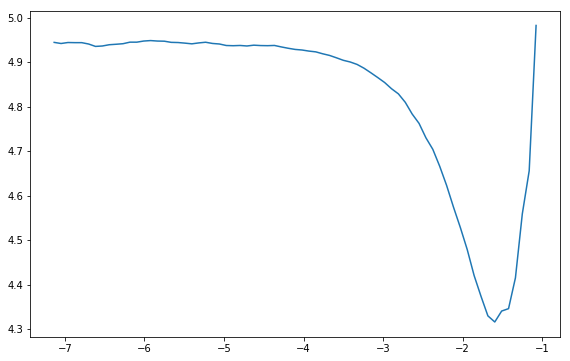

In [122]:
plt.rcParams['figure.figsize'] = [9.5, 6]
plt.plot(logs[10:-7],losses[10:-7])

# Training loop

In [123]:
train_losses, valid_losses, train_acc_history, val_acc_history, lr_hist = [], [], [], [], [] 
best_acc, best_val_epoch, best_acc_epoch, epoch_loss_min = 0.0, 0, 0, np.Inf

In [124]:
def train_model(model, criterion, optimizer, dataloaders, scheduler, use_scheduler=False, 
                use_weights=False, num_epochs=50, first_epoch=0, ufilename=None, 
                is_inception=False):
    
    global train_losses, valid_losses, val_acc_history, lr_hist
    global best_acc, best_val_epoch, best_acc_epoch, epoch_loss_min
    global model_name
    
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_optim_wts = copy.deepcopy(optimizer.state_dict())

    curr_lr = get_learning_rate(optimizer)
    
    # if first_epoch is used assume its to restart training at that point using 1-based indexing
    # so decrement by 1 then add the value to num_epochs
    if first_epoch > 0:
        first_epoch -= 1
        num_epochs = first_epoch + num_epochs
    
    for epoch in range(first_epoch, num_epochs):
        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        print('-' * 11)

        # Each epoch has a training and validation phase
        for phase in ['train', 'valid']:
            if phase == 'train':
                if use_scheduler==True: 
                    if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
                        # using best accuracy - the max setting
                        scheduler.step(best_acc)
                    else:    
                        scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
# ref https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                    # Special case for inception because in training it has an auxiliary output. 
                    # In train mode we calculate the loss by summing the final output and 
                    # the auxiliary output
                    # but in testing we only consider the final output.
                    
                    outputs = model(inputs)
                    
                    if isinstance(outputs, tuple):
                        if epoch == first_epoch:
                            print("Outputs:", outputs)
                        
                        if is_inception and phase == 'train':
                            loss1 = criterion(outputs[0], labels)
                            loss2 = criterion(outputs[1], labels)
                            loss = loss1 + 0.4*loss2
                        else:    
                            loss = sum((criterion(o,labels) for o in outputs))
                    else:
                        loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)
                    
                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * (1 if use_weights==True else inputs.size(0))
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            if phase == 'train':
                train_losses.append(epoch_loss)
                curr_lr = get_learning_rate(optimizer)
                lr_hist.append(curr_lr)
                
                print("Learning rate: {}".format(curr_lr))
                
            if phase == 'valid':
                valid_losses.append(epoch_loss)
                val_acc_history.append(epoch_acc.item())
                                
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'valid' and epoch_acc > best_acc:
                filename = model_name + '_acc_'
                if ufilename is not None:
                    filename = filename + ufilename + '_'
                else:    
                    if use_scheduler==True:
                        filename = filename + 'schd_'
                    if use_weights==True:
                        filename = filename + 'wgts_'
                ### filename = filename + str(epoch+1) 
                if filename[-1:] == "_":
                    filename = filename[:-1]
                    
                print(
                    'Accuracy has increased ({:.6f} --> {:.6f}).  Saving model as {}...'.format(
                    best_acc, epoch_acc,
                    filename))

                best_acc_epoch = epoch+1
                best_acc = epoch_acc
                
                best_model_wts = copy.deepcopy(model.state_dict())
                best_optim_wts = copy.deepcopy(optimizer.state_dict())
                torch.save(best_model_wts, filename + '.pt')
                torch.save(best_optim_wts, filename + '_optimizer.pt')               
                
            if phase == 'valid' and epoch_loss <= epoch_loss_min:
                filename = model_name + '_'
                if ufilename is not None:
                    filename = filename + ufilename + '_'
                else:    
                    if use_scheduler==True:
                        filename = filename + 'schd_'
                    if use_weights==True:
                        filename = filename + 'wgts_'
                ### filename = filename + str(epoch+1) 
                if filename[-1:] == "_":
                    filename = filename[:-1]
                
                print(
                    'Validation loss decreased ({:.6f} --> {:.6f}).  Saving model as {}...'.format(
                epoch_loss_min,
                epoch_loss,
                filename))
                
                best_val_epoch = epoch+1
                epoch_loss_min = epoch_loss
                
                torch.save(model.state_dict(), filename + '.pt')
                torch.save(optimizer.state_dict(), filename + '_optimizer.pt')

        print()

    time_elapsed = time.time() - since
    
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best validation Accuracy: {:4f}'.format(best_acc))
    print('Best accuracy epoch     : {}'.format(best_acc_epoch))
    print('Best validation Loss    : {:4f}'.format(epoch_loss_min))
    print('Best validation epoch   : {}'.format(best_val_epoch))
    
    # load best model weights
    model.load_state_dict(best_model_wts)
    optimizer.load_state_dict(best_optim_wts)

# Not automatically overwriting model_transfer state_dict as this may not be the best model...
#     # Save to required model_scratch
#     torch.save(model.state_dict(), 'model_transfer.pt')
#     torch.save(optimizer.state_dict(), 'model_transfer_optimizer.pt') 

    return model

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_transfer.pt'`.

### The training loop - "1 cycle" approach:
- [Inspired](https://forums.fast.ai/t/the-1cycle-policy-an-experiment-that-investigate-super-convergence-phenomenon-described-in-leslie-smiths-research/14737) by the ['1 cycle'](https://sgugger.github.io/the-1cycle-policy.html) approach described by [Leslie Smith](https://scholar.google.com/citations?user=pwh7Pw4AAAAJ&hl=en) in his paper ["A Disciplined Approach to Neural Network Hyper-Parameters: Part 1 - Learning Rate, Batch Size, Momentum, and Weight Decay"](https://arxiv.org/abs/1803.09820). 
- Starts with a low learning rate then gradually increases to the maximum useful rate, then returns to the lowest useful rate
- See below for further discussion and results from this approach and comparisons with a classic approach

In [125]:
# experiment with training loop inspired by the 1 cycle approach, 
# starting with a low rate, up to very high, then back again...
step = 10
start_epoch = 1
end_epoch = start_epoch + step

start = 1e-05
middle = 1e-03
end = 1e-04

lr = start
start_epoch = 1

with active_session():
    # train the model
    
    while lr < middle:
        print(lr)
        parameters = filter(lambda p: p.requires_grad, model_transfer.parameters())
        optimizer_transfer = optim.Adam(parameters, lr=lr)
        end_epoch = start_epoch + step - 1
        print(str(start_epoch), " --> ", str(end_epoch))
        print()

        model_transfer = train_model(model_transfer, 
                        criterion_transfer, 
                        optimizer_transfer,
                        loaders_transfer,         
                        exp_lr_scheduler, 
                        use_scheduler=False, 
                        use_weights=use_weights, 
                        num_epochs=step,
                        first_epoch=start_epoch,
                        ufilename="1cycle_1",
                        is_inception=(model_name=="inception"))

        print()
        print('=' * 20)
        print()

        start_epoch = end_epoch + 1

        lr *= 10
        lr = round(lr, 8)

        # set step to 15 for remaining up cycle
        step = 15

# break here if wanting to split training before the down cycle
# (if so, will need need its own active_session wrapper)
    # with active_session():
    step = 15    
    while lr >= end:
        print(lr)
        parameters = filter(lambda p: p.requires_grad, model_transfer.parameters())
        optimizer_transfer = optim.Adam(parameters, lr=lr)
        end_epoch = start_epoch + step - 1
        print(str(start_epoch), " --> ", str(end_epoch))
        print()

        model_transfer = train_model(model_transfer, 
                        criterion_transfer, 
                        optimizer_transfer,
                        loaders_transfer,         
                        exp_lr_scheduler, 
                        use_scheduler=False, 
                        use_weights=use_weights, 
                        num_epochs=step,
                        first_epoch=start_epoch,
                        ufilename="1cycle_1",
                        is_inception=(model_name=="inception"))

        print()
        print('=' * 20)
        print()

        start_epoch = end_epoch + 1

        lr *= 1/10
        lr = round(lr, 8)


## Chart "1 cycle" training losses and accuracy

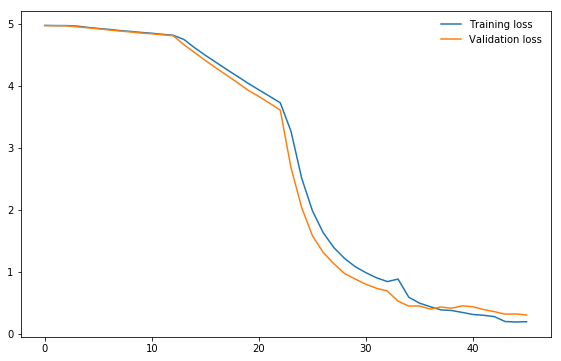

In [126]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(train_losses[2:], label="Training loss")
plt.plot(valid_losses[2:], label="Validation loss")
plt.legend(frameon=False)
plt.show()

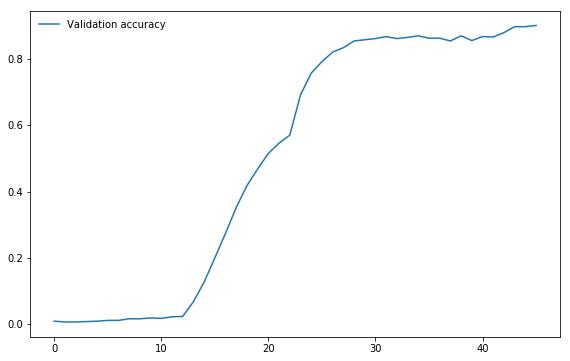

In [127]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(val_acc_history[2:], label="Validation accuracy")
plt.legend(frameon=False)
plt.show()

## "1 cycle" variation, based on 0.005 learning rate
- this was a more natural rate as suggested by the learning rate finder
- it converged more quickly, was smoother, but ultimately was fractionally less accurate (see analysis below)

In [128]:
step = 15
start_epoch = 1
end_epoch = start_epoch + step

start = 0.00005
middle = 0.00005
end = 0.000005

lr = start
start_epoch = 1

with active_session():    
    while lr <= middle:
        print(lr)
        parameters = filter(lambda p: p.requires_grad, model_transfer.parameters())
        optimizer_transfer = optim.Adam(parameters, lr=lr)
        end_epoch = start_epoch + step - 1
        print(str(start_epoch), " --> ", str(end_epoch))
        print()

        model_transfer = train_model(model_transfer, 
                        criterion_transfer, 
                        optimizer_transfer,
                        loaders_transfer,         
                        exp_lr_scheduler, 
                        use_scheduler=False, 
                        use_weights=use_weights, 
                        num_epochs=step,
                        first_epoch=start_epoch,
                        ufilename="1cycle_4",
                        is_inception=(model_name=="inception"))

        print()
        print('=' * 20)
        print()

        start_epoch = end_epoch + 1

        lr *= 10
        lr = round(lr, 8)


    # with active_session():
    # Step at 15 per epoch for remaining of training run
    step = 15    
    while lr >= end:
        print(lr)
        parameters = filter(lambda p: p.requires_grad, model_transfer.parameters())
        optimizer_transfer = optim.Adam(parameters, lr=lr)
        end_epoch = start_epoch + step - 1
        print(str(start_epoch), " --> ", str(end_epoch))
        print()

        model_transfer = train_model(model_transfer, 
                        criterion_transfer, 
                        optimizer_transfer,
                        loaders_transfer,         
                        exp_lr_scheduler, 
                        use_scheduler=False, 
                        use_weights=use_weights, 
                        num_epochs=step,
                        first_epoch=start_epoch,
                        ufilename="1cycle_4",
                        is_inception=(model_name=="inception"))

        print()
        print('=' * 20)
        print()

        start_epoch = end_epoch + 1

        lr *= 1/10
        lr = round(lr, 8)

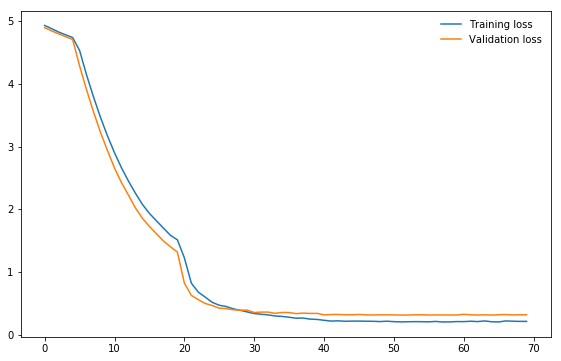

In [129]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(train_losses, label="Training loss")
plt.plot(valid_losses, label="Validation loss")
plt.legend(frameon=False)
plt.show()

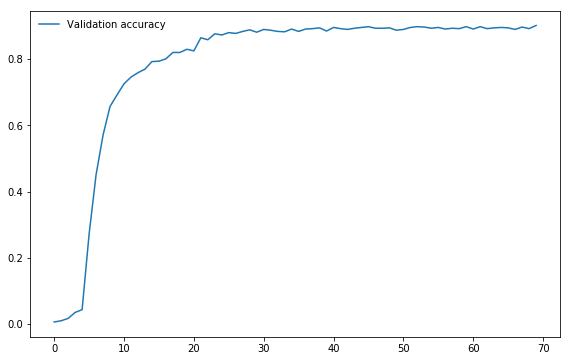

In [130]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(val_acc_history, label="Validation accuracy")
plt.legend(frameon=False)
plt.show()

## The classic approach
- See comparitive results below
- Uses learning rate scheduler
- Can be used iteratively to add more training, by adjusting the num_epochs and first_epoch
- Adjusting first_epoch to next projected epoch number will add to the current count 
- and to the arrays of validation loss and accuracy

In [131]:
with active_session():
    # train the model
    model_transfer = train_model(model_transfer, 
                        criterion_transfer, 
                        optimizer_transfer,
                        loaders_transfer,         
                        exp_lr_scheduler, 
                        use_scheduler=True, 
                        use_weights=use_weights, 
                        num_epochs=50,
                        first_epoch=1,
                        ufilename="std",
                        is_inception=(model_name=="inception"))

# load the model that got the best validation accuracy (uncomment the line below)
 #model_transfer.load_state_dict(torch.load('model_transfer.pt'))

Epoch 1/50
-----------
Learning rate: [0.05]
train Loss: 56.9397 Acc: 0.2900
valid Loss: 14.6772 Acc: 0.6108
Accuracy has increased (0.000000 --> 0.610778).  Saving model as resnet152_acc_std...
Validation loss decreased (inf --> 14.677224).  Saving model as resnet152_std...

Epoch 2/50
-----------
Learning rate: [0.05]
train Loss: 8.4167 Acc: 0.6734
valid Loss: 4.3878 Acc: 0.7832
Accuracy has increased (0.610778 --> 0.783234).  Saving model as resnet152_acc_std...
Validation loss decreased (14.677224 --> 4.387796).  Saving model as resnet152_std...

Epoch 3/50
-----------
Learning rate: [0.05]
train Loss: 4.0415 Acc: 0.7633
valid Loss: 4.3504 Acc: 0.7629
Validation loss decreased (4.387796 --> 4.350360).  Saving model as resnet152_std...

Epoch 4/50
-----------
Learning rate: [0.05]
train Loss: 4.1976 Acc: 0.7720
valid Loss: 5.5561 Acc: 0.7737

Epoch 5/50
-----------
Learning rate: [0.05]
train Loss: 4.6390 Acc: 0.7737
valid Loss: 4.7604 Acc: 0.8036
Accuracy has increased (0.783234 --

## Chart classic training losses and accuracy

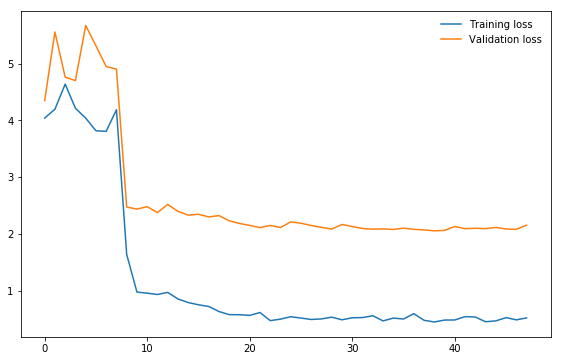

In [132]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(train_losses[2:], label="Training loss")
plt.plot(valid_losses[2:], label="Validation loss")
plt.legend(frameon=False)
plt.show()

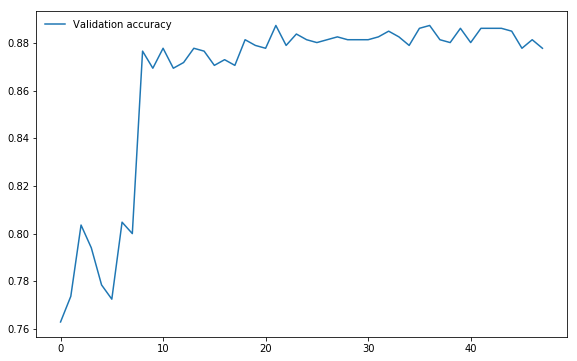

In [133]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(val_acc_history[2:], label="Validation accuracy")
plt.legend(frameon=False)
plt.show()

---

### Run to overwrite required model_transfer state dict file with this model's state dict

### Run to load model_transfer state dict if needed...

In [134]:
model_transfer.load_state_dict(torch.load('model_transfer.pt'))
optimizer_transfer.load_state_dict(torch.load('model_transfer_optimizer.pt'))

## Save checkpoint data if needed

## [Re-load](#reloadModel) checkpoint dictionary if needed

These checkpoint dictionaries contain the various arrays creatd during training, so can be used to recreate charts
- **model_1cycle_1** contains the same state_dict as is saved in model_transfer.pt
- **model_1cycle_8** contains the state_dict obtained from the model trained with the variation of the 1 cycle (above)
- **model_standard_mk2** containes the state_dict of a model processed with a standard training loop (also above)

In [135]:
state_dicts_name = 'model_1cycle_1.pth'
learning_rate=0.001
reloadModel(model_transfer, optimizer_transfer, state_dicts_name, learning_rate, isV1=True)

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 60%.

## Test best model
- load from **model_transfer.pt** or **model_1cycle_1.pth**

In [136]:
test(loaders_transfer, model_transfer, criterion_transfer, use_cuda)

Test Loss: 0.357339


Test Accuracy: 90% (753/836)


## Test model trained with variation of 1cycle 
- load from **model_1cycle_8.pth**

In [137]:
test(loaders_transfer, model_transfer, criterion_transfer, use_cuda)

Test Loss: 0.370314


Test Accuracy: 89% (751/836)


## Test model trained with classic approach
- load from **model_standard_mk2.pth**

In [138]:
test(loaders_transfer, model_transfer, criterion_transfer, use_cuda)

Test Loss: 3.045314


Test Accuracy: 88% (740/836)


---
<a id='transfermodelanalysis'></a>
## Analysis of transfer model variations

The best performing training cycle was using the "1cycle" approach with a very slow build up from a learning rate of 1e-07, until 1e-03, then back to 1e-04. 

But this was compared with a number of other approaches, including an initial standard approach for comparison. 

With the "1cycle" approach the first thing I tried was to go all the way from 1e-07 up to 1e-01 and back to 1e-08. This showed that there was no further useful activity above 1e-03, and on the way back down nothing useful happening beyond 1e-04. 

I also assessed cycles around a 5e-03 peak as variations around this were more in line with the ideal learning rate.

### The working training cycle:
- **1e-07 --> 1e-03 --> 1e-04** 
- Best accuracy at epoch 48
- Trained for 55 epochs
- The 90% accuracy was the best, so this model is used, but a possibly more predictable approach was used in variation 1
- Reported test results:
```
Test Loss: 0.357339
Test Accuracy: 90% (753/836)
```

<img src="images/transfer_loss_1cycle_1.JPG" width="550" align="left">      
<img src="images/transfer_acc_1cycle_1.JPG" width="550" align="left"> 

### Extend learning for 20 additional epochs, going down to 1e-06:
- **1e-07 --> 1e-03 --> 1e-06**
- Same model as the working model, just added the epochs
- There was no further improvement beyond the original epoch 48 
    
<img src="images/transfer_loss_1cycle_1_full.JPG" width="550" align="left">      
<img src="images/transfer_acc_1cycle_1_full.JPG" width="550" align="left"> 

### Variation of one cycle approach: use 0.05 learning rate as basis of adjustments
- **5e-05 --> 5e-04 --> 5e-06**
- This was the culmination of a series of tests around using fractions of 0.05 as a learning rate
- 0.05 was chosen based on the learning rate finder
- The best approach was to start at 0.0005 and go up just to 0.005 before coming down again
- An experiment with weight decay for the latter part of the training did not yield a benefit
- The 2 layer classfier was tested and performed better on validation data but not as well on test data
- Trained for 60 epochs
- Best accuracy at epoch 45
- Accuracy was 89.8%, so almost as good as the best training loop and more predictable and less effort
- Reported test results:
```
Test Loss: 0.370314
Test Accuracy: 89% (751/836)
```

<img src="images/transfer_loss_1cycle__8.JPG" width="550" align="left">        
<img src="images/transfer_acc_1cycle__8.JPG" width="550" align="left"> 

### Standard exploratory run
- Ran 30 cycles with a learning rate of 1e-05 to analyse model, data, and training losses

<img src="images/transfer_loss_std.JPG" width="550" align="left">        
<img src="images/transfer_acc_std.JPG" width="550" align="left"> 

### Standard approach: starting from 0.05 and decreasing lr:
- Also a culmination of serveral tests...
- Started with a learning rate of 0.05, based on learning rate finder
- Reduced learning rate by a factor of 10 every 10 epochs
- Best accuracy was at epoch 24, at 88.5% (740/836)
- The training and validation losses were quite diverged
- I evaluated weight decay of 1e-04 which brought the losses a little closer together but didn't affect the outcome
- At this stage fine-tuning this was familiar territory so I decided instead to devise and test a "1 cycle" approach
- By comparison the train and validation numbers are closely aligned with the 1 cycle approach, and accuracy increases by 1.5%
- Reported test results:
```
Test Loss: 3.045314            - 1 cycle was 0.357339
Test Accuracy: 88% (740/836)   - 1 cycle was 90% (753/836)  
```

<img src="images/transfer_loss_std_udacity.JPG" width="550" align="left">        
<img src="images/transfer_acc_std_udacity.JPG" width="550" align="left">  

## Training conclusion
The "1 cycle" approach has worked fairly well, it is gained a 1.5% increase in accuracy and the maintenance of a much closer relationship between training and validation losses, when compared with a standard approach (and not truncating the accuracy calculation). There is more to investigate about it so that I implement it more consistently and according to the intended design, but even this hack at it was an eye-opener.

---

### Set up standard ImageNet predictor to assist with assessing non-dog images

In [139]:
import torch
import torch.nn.functional as F
import torchvision.models as models
ImageNetDict = eval(open("imagenet1000_clsidx_to_labels.txt").read())

resnetImageNet = models.resnet152(pretrained=True)
resnetImageNet.class_to_name = ImageNetDict
resnetImageNet.eval();

In [140]:
def ImageNet_predict(img_path, topk=1):
    '''
    Use pre-trained resnet152 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        topk: number of predictions to return (allow for top 5 for instance)
        
    Returns:
        Index(s) corresponding to resnet152 model's prediction
        Probability of the prediction(s)
    '''
    
    img = img_process(img_path)
    img_tensor = torch.from_numpy(img).type(torch.FloatTensor)
    img_tensor.unsqueeze_(0)

    resnetImageNet.cpu()
    resnetImageNet.eval()
    
    with torch.no_grad():
        log_ps = F.softmax(resnetImageNet.forward(img_tensor), dim=1)
        probs, classes = torch.topk(log_ps, k=topk)

        probs = probs.view(topk).detach().numpy().tolist()
        classes = classes.view(topk).detach().numpy().tolist()
        classnames = [resnetImageNet.class_to_name[cls] for cls in classes]
        
    return classes, classnames, probs

def ImageNet_dog_detector(img_path, inclPrediction=False):
    prediction = ImageNet_predict(img_path)
    
    dog_detected = (prediction[0][0] in range(151, 269))
    
    if inclPrediction==True:
        return (dog_detected, prediction)
    else:    
        return dog_detected

### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan hound`, etc) that is predicted by your model.  

In [141]:
### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.

# list of class names by index, i.e. a name can be accessed like class_names[0]
class_names = [item[4:].replace("_", " ") for item in image_datasets['train'].classes]
class_examples = eval(open("dog_examples.txt").read())

model_transfer.class_to_name = dict(zip(range(133), class_names))
model_transfer.class_to_example = class_examples

def predict_breed_transfer(img_path, topk=1):
    # load the image and return the predicted breed
    img = img_process(img_path)
    
    img_tensor = torch.from_numpy(img).type(torch.FloatTensor)
    img_tensor.unsqueeze_(0)

    model_transfer.cpu()
    model_transfer.eval()
    
    with torch.no_grad():
        log_ps = F.softmax(model_transfer.forward(img_tensor), dim=1)
        probs, classes = torch.topk(log_ps, k=topk)

        probs = probs.view(topk).detach().numpy().tolist()
        classes = classes.view(topk).detach().numpy().tolist()
        classnames = [model_transfer.class_to_name[cls] for cls in classes]
        classexamples = [model_transfer.class_to_example[cls] for cls in classes]
        
    return classnames, classes, probs, classexamples   

In [142]:
predict_breed_transfer('/data/dog_images/test/011.Australian_cattle_dog/Australian_cattle_dog_00728.jpg', 5)

(['Australian cattle dog',
  'Canaan dog',
  'Finnish spitz',
  'Icelandic sheepdog',
  'Cardigan welsh corgi'],
 [10, 42, 66, 83, 44],
 [0.7505977153778076,
  0.07450136542320251,
  0.07055043429136276,
  0.061345312744379044,
  0.009592127054929733],
 ['/data/dog_images/train/011.Australian_cattle_dog/Australian_cattle_dog_00723.jpg',
  '/data/dog_images/train/043.Canaan_dog/Canaan_dog_03061.jpg',
  '/data/dog_images/train/067.Finnish_spitz/Finnish_spitz_04655.jpg',
  '/data/dog_images/train/084.Icelandic_sheepdog/Icelandic_sheepdog_05715.jpg',
  '/data/dog_images/train/045.Cardigan_welsh_corgi/Cardigan_welsh_corgi_03213.jpg'])

---
<a id='step5'></a>
## Step 5: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `human_detector` functions developed above.  You are __required__ to use your CNN from Step 4 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


### (IMPLEMENTATION) Write your Algorithm

In [143]:
### TODO: Write your algorithm.
### Feel free to use as many code cells as needed.

In [144]:
import ntpath
from PIL import Image, ImageFile, ImageFont, ImageDraw

def face_detector2(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    faces_found = len(faces) > 0
    if faces_found:
        for (x,y,w,h) in faces:
            # add bounding box to color image
            cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2) 
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    return (faces_found, img)

def process_prediction(img_path, threshold=0.25):
    ## handle cases for a human face, dog, and neither
    isdog = False
    ishuman = False
    isunknown = False
    altClass = ""
    
    isFromDogData = ('dog_images/' in img_path.lower()) or ('dog_images\\' in img_path.lower())
    isFromHumanData = ('lfw/' in img_path.lower()) or ('lfw\\' in img_path.lower())

    dog_breed_data = predict_breed_transfer(img_path)
    imagenet_data = ImageNet_dog_detector(img_path, True)
    altClass = imagenet_data[1][0]
    altClassName = imagenet_data[1][1]
    
    prediction = dog_breed_data[2][0]
    
    # Signify a dog if the probabilty of a dog is above a threshold 
    isdog = (prediction > threshold)
        
    # If the probabilty of a dog falls below a threshold and a standard 
    # imagenet classifier returns non-dog, make it unknown
    if isdog == False:
        if imagenet_data[0] == False:
            isunknown = True
        
    face_data = face_detector2(img_path)
    
    if face_data[0] > 0 or altClass in [834]:
        # could be a human
        ishuman = True
        img = face_data[1]
    else:
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # ground truth image... square crop it
    # see http://corochann.com/basic-image-processing-tutorial-1220.html
    ground_truth_img = cv2.imread(dog_breed_data[3][0])
    ground_truth_img = cv2.cvtColor(ground_truth_img, cv2.COLOR_BGR2RGB)
    height, width = ground_truth_img.shape[:2]
    crop_length = min(height, width)
    height_start = (height - crop_length) // 2
    width_start = (width - crop_length) // 2
    ground_truth_img = ground_truth_img[
                    height_start:height_start+crop_length, 
                    width_start:width_start+crop_length,
                    :]

    return dog_breed_data, imagenet_data, [isdog, ishuman, isunknown, 
                                           isFromDogData, isFromHumanData], img, ground_truth_img

def run_app(img_path, threshold=0.35):
    img_name = ntpath.basename(ntpath.dirname(img_path)) + "/" + ntpath.basename(img_path)
    subject_name = ntpath.basename(img_path).replace("_", " ")
    color = "black"
    
    image_data = process_prediction(img_path, threshold)
    
    prediction = image_data[0][2]
    prediction = prediction[0]
    
    imagenetdog  = image_data[1][0]
    imagenetpred = image_data[1][1][0][0]
    imagenetname = image_data[1][1][1][0]
    
    # image_data[2] = [isdog, ishuman, isunknown, isFromDogData, isFromHuamData] 
    if image_data[2][0] == True and image_data[2][3] == True:
        message1 = "You are a dog for sure!"
        message2 = ":)"
    elif image_data[2][0] == True and image_data[2][1] == True:
        message1 = str(round(prediction * 100)) + "% like the guy on the right!" 
        message2 = "but, maybe you are people..."
    elif image_data[2][0] == False and image_data[2][1] == True:
        message1 = "Look like a human, yay!"
        message2 = "the lucky dog looks like you!"
    elif (prediction <= threshold) or (imagenetpred not in range(151, 269)):
        message1 = "Somthing doggy about you..."
        message2 = "not sure what kind of dog!"
        if imagenetdog == False:
            if imagenetpred in range(269,280): # wolves etc.
                message2 = "maybe a cousin of sorts?"
            elif imagenetpred in range(280,294): # cats etc.
                message2 = "some cat disagrees :)"
            elif imagenetpred in range(294,298): # bears etc.    
                message2 = "can you bear the thought?"
            elif imagenetpred in range(365,385): # primates
                message2 = "just monkeying around!"
            elif imagenetpred >= 398: # man-made stuff...
                message2 = "but that doesn't seem possible!"
            else:
                message2 = "but nobody is perfect!"
    elif image_data[2][0] == True and prediction > threshold:
        message1 = "Look like a dog for sure..."
        message2 = "!!!"
    elif image_data[2][0] == False:
        message1 = "What are you?"
        message2 = "??????"
    elif image_data[2][2] == True:
        message1 = "I know you're unknown..."
        message2 = "How can that be?"
    else:
        message1 = "I know nothing!"
        message2 = "really..."
        
    _, axes = plt.subplots(figsize=(20,6), ncols=3)

    for ii in range(3):
        ax = axes[ii]
        if ii == 0:
            img = image_data[3]
            title = subject_name
            filename =  img_name
        elif ii == 1:
            newimg = Image.new('RGB', (224, 224), (255, 255, 255))
            fnt = ImageFont.truetype('images/calibri.ttf', 18)
            d = ImageDraw.Draw(newimg)
            d.text((4, 20), message1, font=fnt, fill=(0, 0, 0))
            d.text((5, 50), message2, font=fnt, fill=(0, 0, 0))
            newimg.save('images/textmsg.jpg')
            img = cv2.imread('images/textmsg.jpg')
            title = ""
            filename = ""
        else:
            img = image_data[4]
            title = image_data[0][0]
            title = title[0]
            filename = ""

        ax.imshow(img)    
        ax.tick_params(axis='both', length=0)
        ax.set_xticklabels('')
        ax.set_yticklabels('')
        
        ax.set_title(title, color=color)
        ax.set_xlabel(filename)
        if ii == 1:
            ax.set_axis_off()
            
    if os.path.isfile('images/textmsg.jpg'):    
        os.remove('images/textmsg.jpg') 

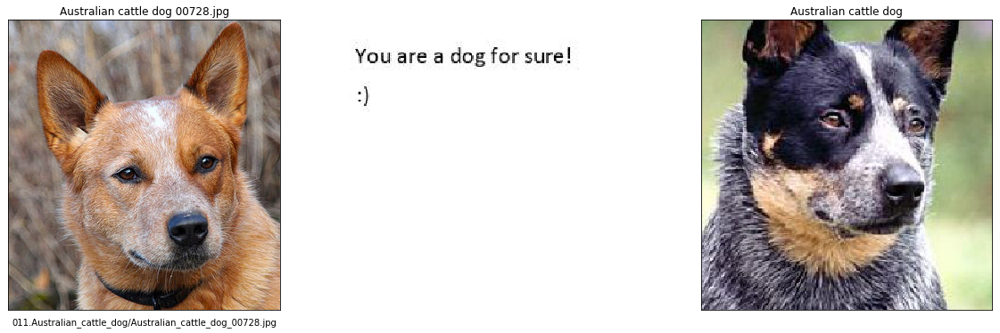

In [145]:
run_app('/data/dog_images/test/011.Australian_cattle_dog/Australian_cattle_dog_00728.jpg')

---
<a id='step6'></a>
## Step 6: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that _you_ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ 

The output is pretty much what I expected:
- the accuracy of the dog breed classifier exceeds my expectations, with a 90% accuracy on test data.
- the incoming image is shown on the left, an example image of the dog that predicted on the right.
- I show the incoming name derived from path information on the incoming image title, together with the filename and parent path as an axis label.
- I show the name of the predicted dog class as the title of the predicted dog image.
- the dog breed classifier is always going to return probablities of a dog no matter what its given, but I use a probability threshold (default 35%) to decide whether or not the image is likely to be a dog or something else.
- the face detector is far from perfect, but if it does detect a face then I consider the possiblility the image is of a human.
- if both dog and human are detected but the dog probability is above the threshold then I assume its a dog and give the probability, but allude to the additional detection of a human. This IMO is more fun than just saying human as it emphasises that the model really thought it was seeing a dog!
- if both dog and human are detected but the dog probability is below the threshold then I assume its a human but indicate that the dog looks like the human.
- I use ancillary information - the predictions of a standard ImageNet resnet model, and the embedded path information of the image, to inform the message variations, but the predictions derive only from model_transfer.
- if the dog prediction is not certain and a human is not detected then I make an observation in some cases (wolves, cats, bears, monkeys) that indicates that a dog is really unlikely.
- other permutations are handled to indicate degrees of certainty, including unknown should it occur.


__Points of improvement:__

- The face detector is poor, if it was firmly capable of detecting faces then I could eliminate the uncertainty of human detection, which at the moment I am trying to solve with the ImageNet classifier and the somewhat complex decision-making process
- The major weakenss of a dog classifier is that it can only predict dog, no matter what its given. We need it to consider humans as dogs, so we can say what kind of dog, but it would be an improvement if the classifier could handle the likeness comparison but still return human. I work around this by considering probabilities and then consulting another classifier in run_app, but an improvement would be for this to be handled by the dog classifier.
- Additionally, the code itself could be moved into a Python class to make it more modular.
- I could include information about where a dog prediction differs from an incoming dog image, based on deducing the class by the directory name.
- Likewise I could be more specific about what I think is really detected if it's not a dog.

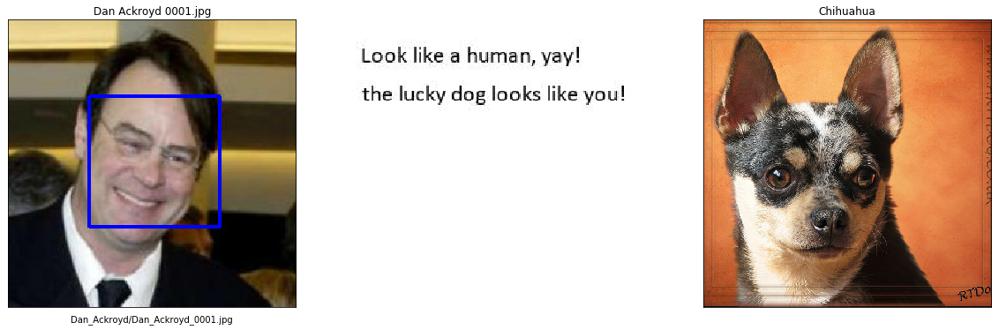

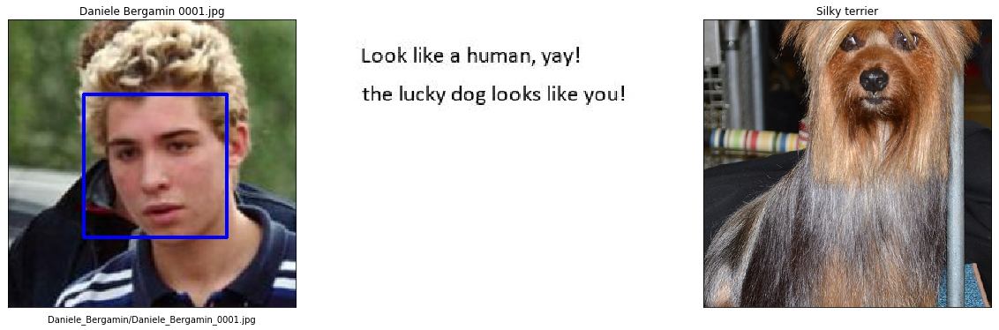

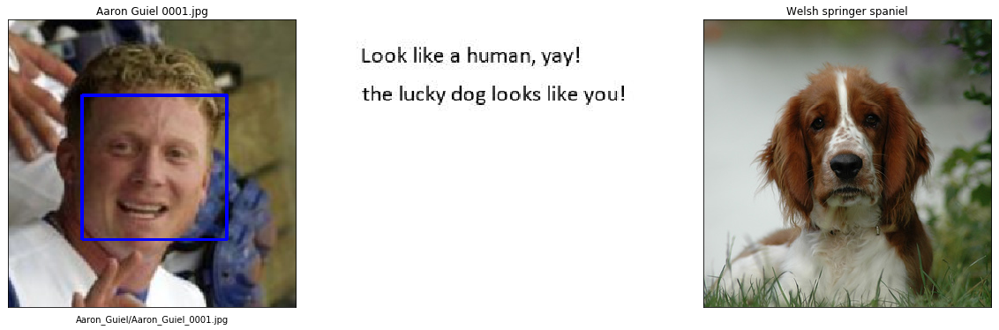

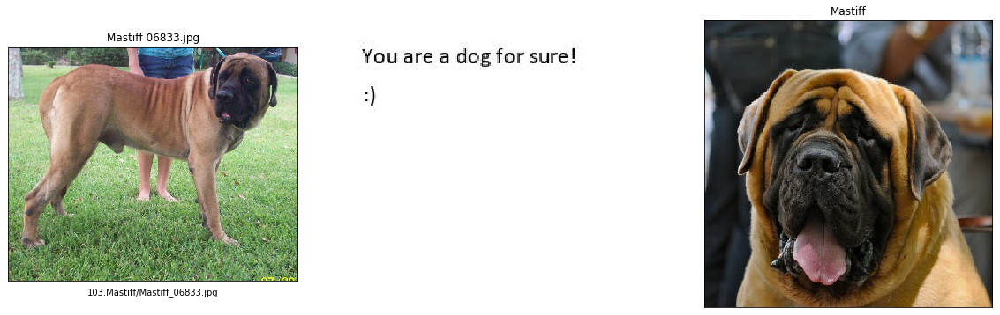

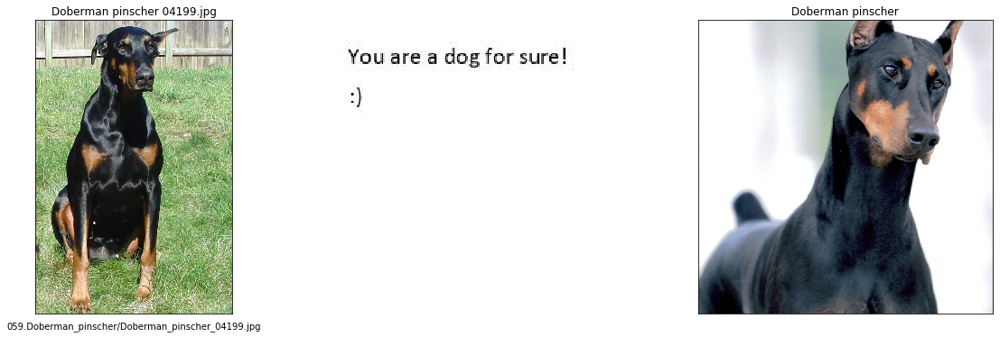

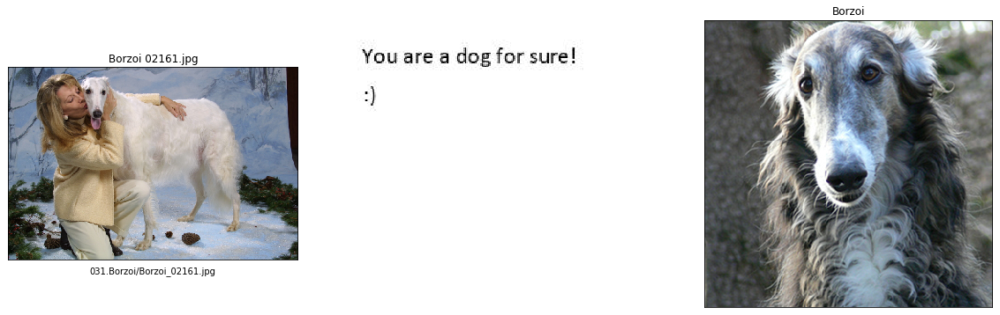

In [146]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.

## suggested code, below
for file in np.hstack((human_files[0], human_files[2],
                       '/data/lfw/Aaron_Guiel/Aaron_Guiel_0001.jpg',
                       dog_files[0], dog_files[80], dog_files[200])):
    run_app(file)

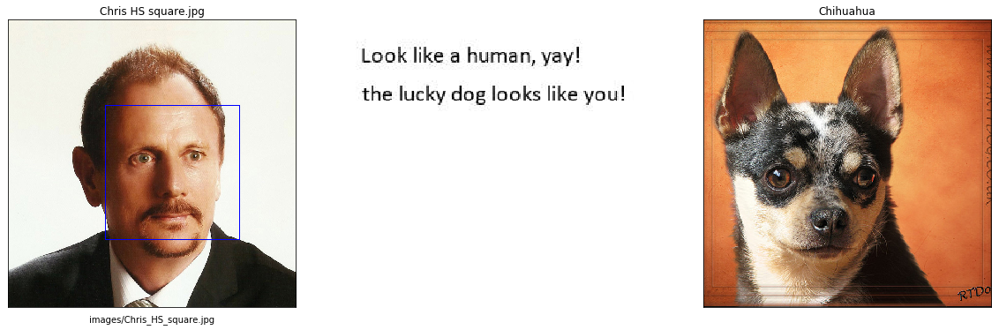

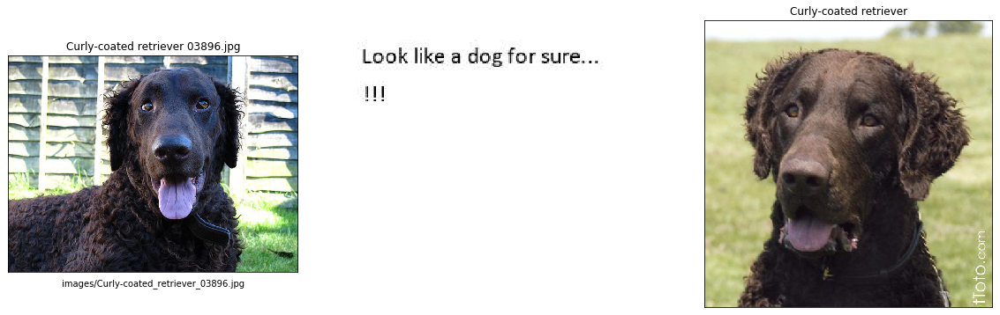

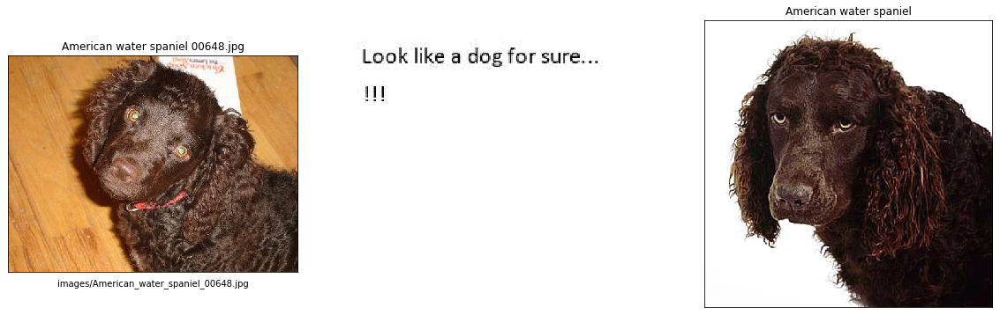

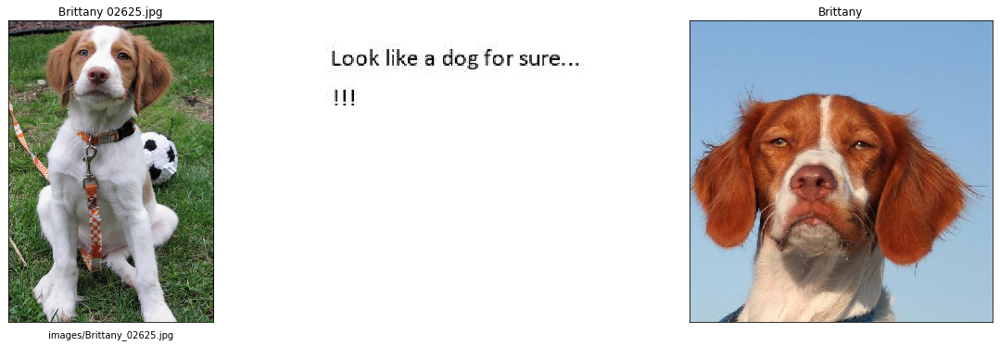

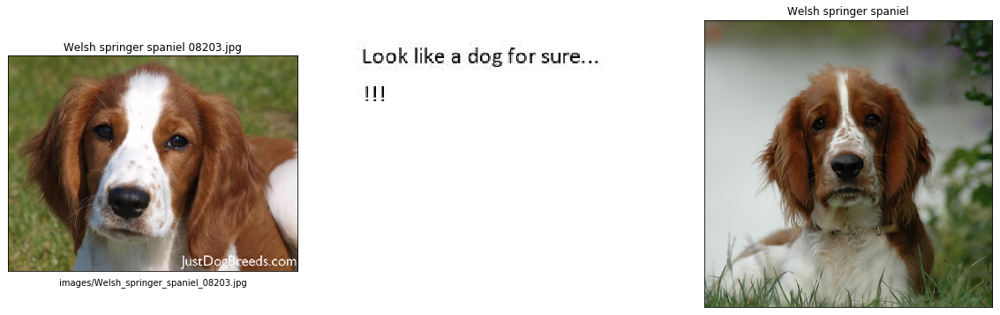

...

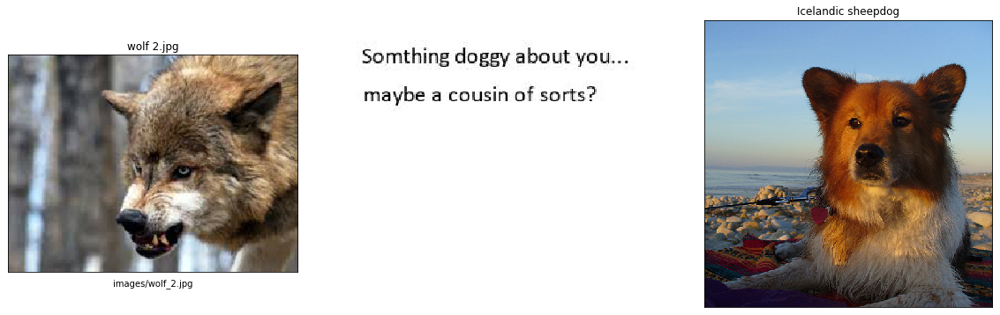

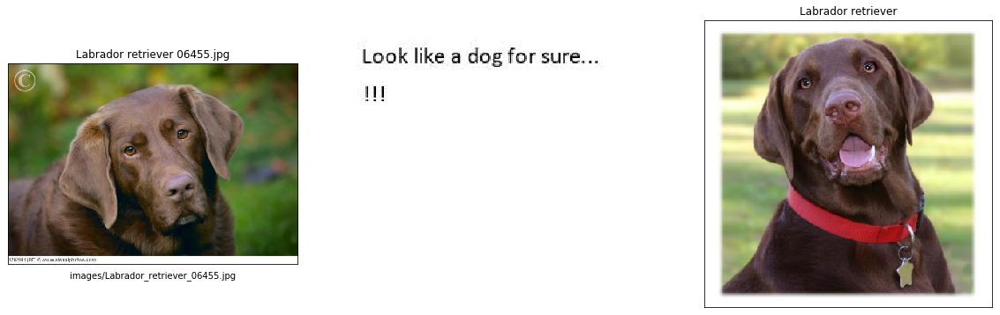

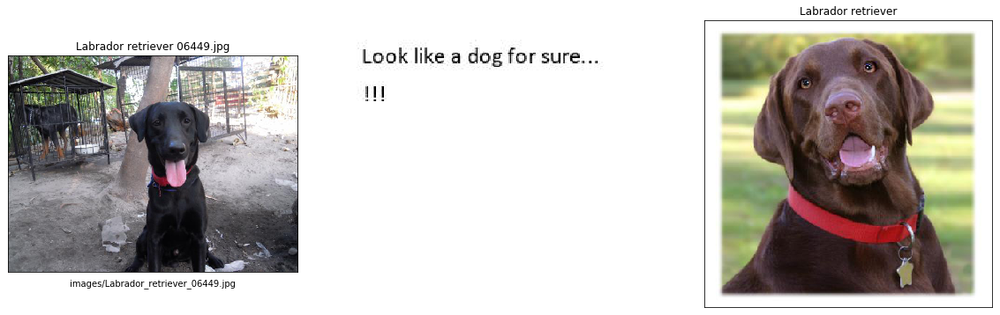

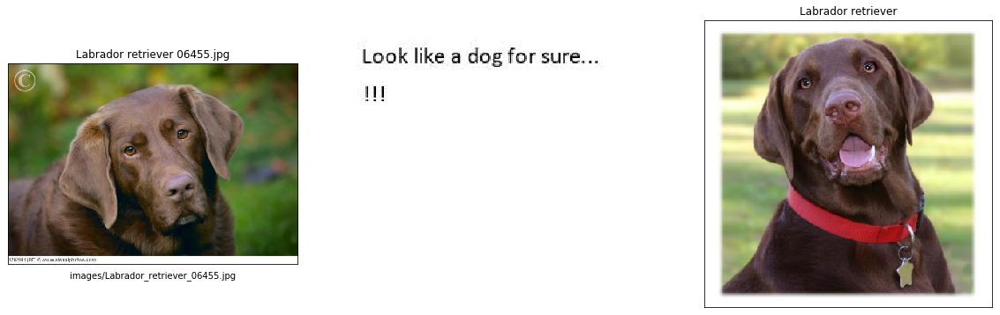

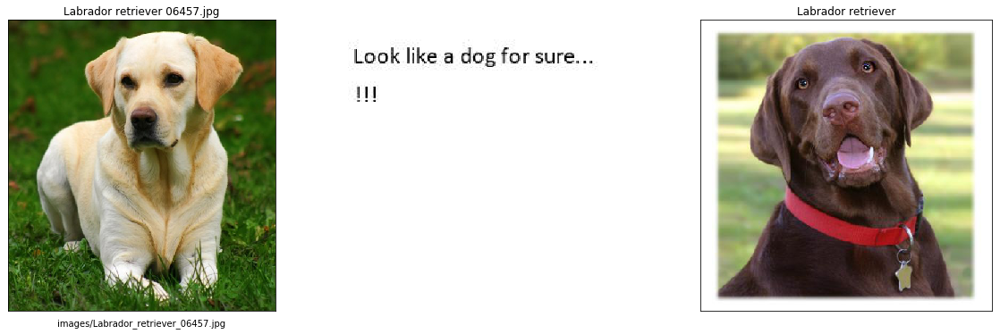

In [147]:
for file in np.hstack(('images/Chris_HS_square.jpg', 
                       'images/Curly-coated_retriever_03896.jpg',
                       'images/American_water_spaniel_00648.jpg',
                       'images/Brittany_02625.jpg',
                       'images/Welsh_springer_spaniel_08203.jpg',
                       'images/cat.69.jpg',
                       'images/cat.3.jpg',
                       'images/cat.10.jpg',
                       'images/black_bear.jpg',
                       'images/gorilla.jpg',
                       'images/chimp.jpg',
                       'images/that_monkey.jpg',
                       'images/monkeys.jpg',
                       'images/goldfish.jpg',
                       'images/wolf_1.jpg',
                       'images/wolf_2.jpg',
                       'images/Labrador_retriever_06455.jpg', 
                       'images/Labrador_retriever_06449.jpg',
                       'images/Labrador_retriever_06455.jpg',
                       'images/Labrador_retriever_06457.jpg'
                      )):
    run_app(file)

# Utilities

In [148]:
%%javascript

// Sourced from http://nbviewer.jupyter.org/gist/minrk/5d0946d39d511d9e0b5a

$("#renumber-button").parent().remove();

function renumber() {
    // renumber cells in order
    var i=1;
    IPython.notebook.get_cells().map(function (cell) {
        if (cell.cell_type == 'code') {
            // set the input prompt
            cell.set_input_prompt(i);
            // set the output prompt (in two places)
            cell.output_area.outputs.map(function (output) {
                if (output.output_type == 'execute_result') {
                    output.execution_count = i;
                    cell.element.find(".output_prompt").text('Out[' + i + ']:');
                }
            });
            i += 1;
        }
    });
}

IPython.toolbar.add_buttons_group([{
  'label'   : 'Renumber',
  'icon'    : 'fa-list-ol',
  'callback': renumber,
  'id'      : 'renumber-button'
}]);

<IPython.core.display.Javascript object>

# Appendix

### Test appearance of different resolutions to find lowest usable value for dataloader... 

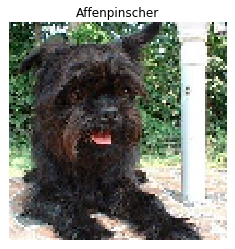

In [149]:
imshow(img_process(train_dir+'001.Affenpinscher/Affenpinscher_00001.jpg', img_sz=100), 
       title='Affenpinscher')

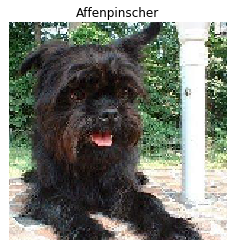

In [150]:
imshow(img_process(train_dir+'001.Affenpinscher/Affenpinscher_00001.jpg', img_sz=150), 
       title='Affenpinscher')

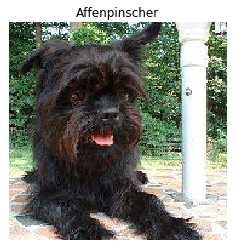

In [151]:
imshow(img_process(train_dir+'001.Affenpinscher/Affenpinscher_00001.jpg', img_sz=180), 
       title='Affenpinscher')

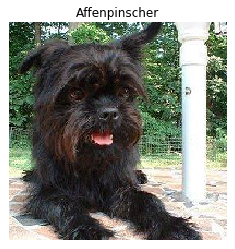

In [152]:
imshow(img_process(train_dir+'001.Affenpinscher/Affenpinscher_00001.jpg', img_sz=200), 
       title='Affenpinscher')

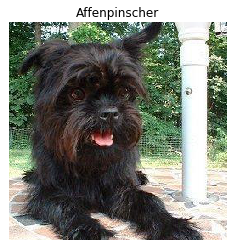

In [153]:
imshow(img_process(train_dir+'001.Affenpinscher/Affenpinscher_00001.jpg', img_sz=224), 
       title='Affenpinscher')

## Other scratch models tried...

## 3 layer CNN 
- this was the most efficient approach to get a result (though there must be better!)

## 3 layer CNN with batchnorm
- this was a little slower to get to the same result as the vanilla 3 layer model
- there was a smoother variation in loss values as the model trained but ultimately it was a point less accurate

## 6 layer CNN 
- not as useful as a simpler design, it took longer to train and didn't get as good accuracy for the same number of epochs

### 4 layer CNN
- this failed to make any progress converging, I abandoned training it

## 3 layer CNN - 48-96-128 configuration, 
## first 300 epochs training run output